In [225]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import statsmodels
# statistics
from statsmodels.distributions.empirical_distribution import ECDF
#from fbprophet import Prophet
from prophet import Prophet
#from fbprophet.plot import plot_plotly
#from fbprophet.plot import add_changepoints_to_plot
import plotly.graph_objects as go
import plotly.express as px
# time series analysis
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import warnings
warnings.filterwarnings("ignore")

from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import  mean_squared_error
import statsmodels.api as sm
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [294]:
c1 = pd.read_csv('data_t10.csv',parse_dates=True,index_col='date')
c1.head()

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347
2014-05-01,Mixers,Mumbai,3864612
2014-06-01,Mixers,Mumbai,2932658
2014-07-01,Mixers,Mumbai,3703713
2014-08-01,Mixers,Mumbai,3931029


In [295]:
c1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4800 entries, 2014-04-01 to 2018-03-01
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   product  4800 non-null   object
 1   city     4800 non-null   object
 2   sales    4800 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 150.0+ KB


In [296]:
c1.shape

(4800, 3)

In [297]:
# The following code is to set the subsequent figure sizes

from pylab import rcParams
rcParams['figure.figsize'] = 20,8

In [298]:
c1.head()

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347
2014-05-01,Mixers,Mumbai,3864612
2014-06-01,Mixers,Mumbai,2932658
2014-07-01,Mixers,Mumbai,3703713
2014-08-01,Mixers,Mumbai,3931029


In [299]:
c1.head(1)

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347


In [300]:
c1.tail(1)

,product,city,sales
date,,,
2018-03-01,SECF,Delhi,36136


In [301]:
c3=pd.DataFrame(c1.groupby(["date"])["sales"].sum())
c3.head()

,sales
date,
2014-04-01,66874255
2014-05-01,57400599
2014-06-01,38002279
2014-07-01,49921646
2014-08-01,51451592


In [302]:
c1

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347
2014-05-01,Mixers,Mumbai,3864612
2014-06-01,Mixers,Mumbai,2932658
2014-07-01,Mixers,Mumbai,3703713
2014-08-01,Mixers,Mumbai,3931029
...,...,...,...
2017-11-01,SECF,Delhi,5837
2017-12-01,SECF,Delhi,7451
2018-01-01,SECF,Delhi,7712


In [281]:
c3

,sales
date,
2014-04-01,66874255
2014-05-01,57400599
2014-06-01,38002279
2014-07-01,49921646
2014-08-01,51451592
2014-09-01,60292763
2014-10-01,65164267
2014-11-01,37661296
2014-12-01,60855672


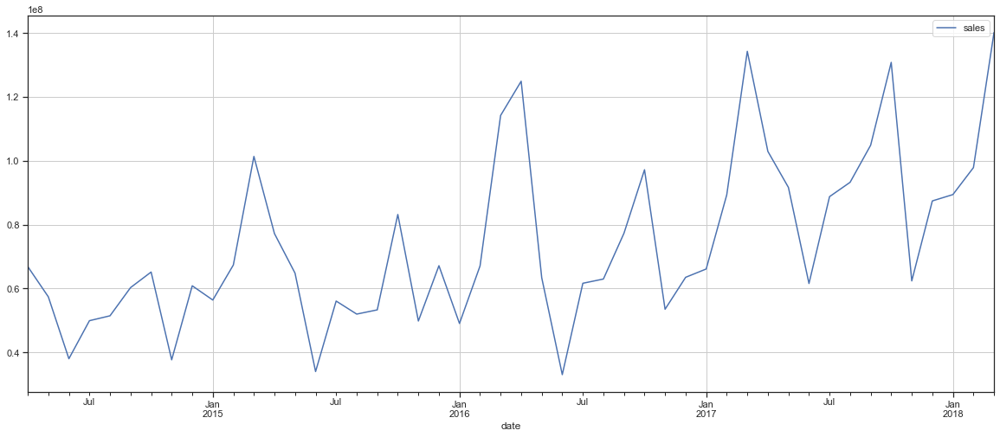

In [282]:
c3.plot()
plt.grid()

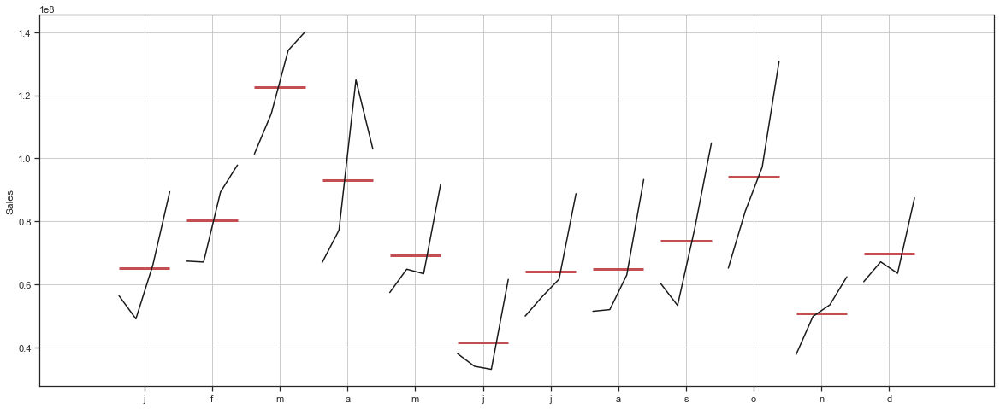

In [283]:
from statsmodels.graphics.tsaplots import month_plot

month_plot(c3['sales'],ylabel='Sales')
plt.grid();

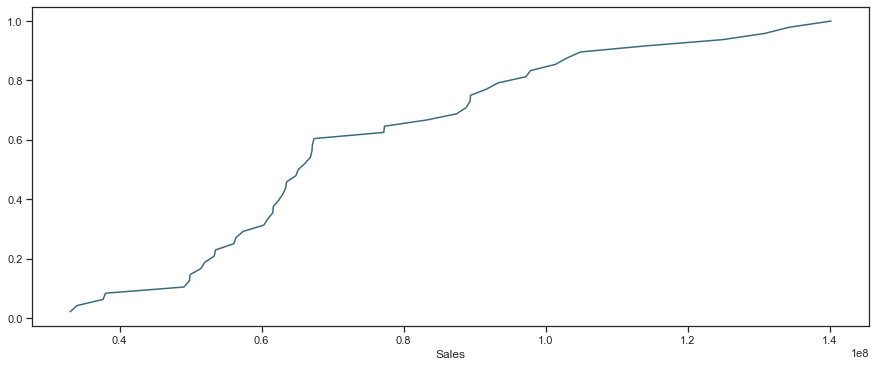

In [284]:
## Plot ECDF: Empirical Cumulative Distribution Function
#ECDF - Adds up the number of observations that are there for a certain value.
sns.set(style = "ticks")# to format into seaborn 
c = '#386B7F' # basic color for plots
plt.figure(figsize = (15, 20))

  
plt.subplot(312)
cdf = ECDF(c3['sales'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = c)
plt.xlabel('Sales');

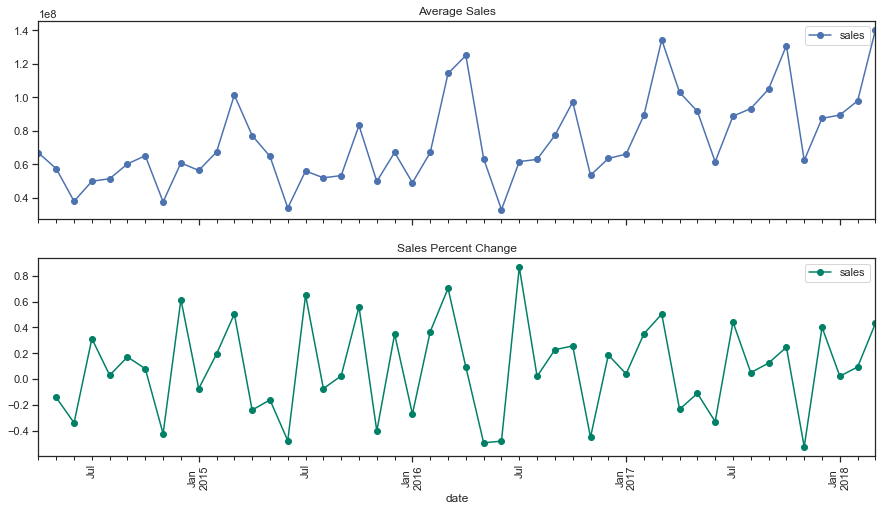

In [285]:
# group by date and get average Sales, and precent change
average_sales    = c3.groupby('date')["sales"].mean()
pct_change_sales = c3.groupby('date')["sales"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,8))

# plot average Sales over time(year-month)
ax1 = average_sales.plot(legend=True,ax=axis1,marker='o',title="Average Sales")
#ax1.set_xticks(range(len(average_sales)))
#ax1.set_xticklabels(average_sales.index.tolist(), rotation=90)
# plot precent change for Sales over time(year-month)
ax2 = pct_change_sales.plot(legend=True,ax=axis2,marker='o',rot=90,colormap="summer",title="Sales Percent Change")

In [286]:
c1.describe(include='all')

,product,city,sales
count,4800,4800,4.800000e+03
unique,10,10,NaN
top,FoodProcessor,Pune,NaN
freq,480,480,NaN
mean,NaN,NaN,7.415188e+05
std,NaN,NaN,1.308447e+06
min,NaN,NaN,0.000000e+00
25%,NaN,NaN,1.171152e+05
50%,NaN,NaN,3.077215e+05
75%,NaN,NaN,7.796660e+05


In [287]:
(c1["sales"].std())/(c1["sales"].mean())

1.764550408991444

In [303]:
c1["sales"].isnull().sum()

0

In [304]:
c2=c1

In [305]:
c2.reset_index(inplace=True)

In [306]:
c1

,date,product,city,sales
0,2014-04-01,Mixers,Mumbai,2679347
1,2014-05-01,Mixers,Mumbai,3864612
2,2014-06-01,Mixers,Mumbai,2932658
3,2014-07-01,Mixers,Mumbai,3703713
4,2014-08-01,Mixers,Mumbai,3931029
...,...,...,...,...
4795,2017-11-01,SECF,Delhi,5837
4796,2017-12-01,SECF,Delhi,7451
4797,2018-01-01,SECF,Delhi,7712
4798,2018-02-01,SECF,Delhi,31525


In [246]:
c1.min()

date       2014-04-01 00:00:00
product               Dry Iron
city                      Ahmd
sales                        0
dtype: object

In [247]:
c2.groupby(["city"]).agg(x=('date','count'))

,x
city,
Ahmd,480
Bangalore,480
Chennai,480
Cochin,480
Delhi,480
Hyderabad,480
Kolkata,480
Mumbai,480
Patna,480


In [248]:
ctemp=pd.DataFrame(c1.groupby(['city','product']).agg({'product':['count']}))
ctemp

product
                          count
city product                   
Ahmd Dry Iron                48
     FoodProcessor           48
     Gas Stove               48
     Induction cookers       48
     Mixers                  48
...                         ...
Pune Oven Toaster Grill      48
     SECF                    48
     Steam Iron              48
     Water Heaters           48
     coolers                 48

[100 rows x 1 columns]

In [307]:
to_plot=c2[(c2['city']=='Pune')& (c2['product']=="Mixers")]
to_plot

,date,product,city,sales
3840,2014-04-01,Mixers,Pune,1034517
3841,2014-05-01,Mixers,Pune,1492157
3842,2014-06-01,Mixers,Pune,1132323
3843,2014-07-01,Mixers,Pune,1430033
3844,2014-08-01,Mixers,Pune,1517802
3845,2014-09-01,Mixers,Pune,1805830
3846,2014-10-01,Mixers,Pune,1672489
3847,2014-11-01,Mixers,Pune,843542
3848,2014-12-01,Mixers,Pune,1595351
3849,2015-01-01,Mixers,Pune,1561402


In [253]:
c1["city"].value_counts()

Pune         480
Patna        480
Chennai      480
Cochin       480
Ahmd         480
Bangalore    480
Mumbai       480
Kolkata      480
Delhi        480
Hyderabad    480
Name: city, dtype: int64

In [254]:
fig = go.Figure([go.Scatter(x=to_plot['date'], y=to_plot['sales'])])
fig.show()

In [310]:
c2.set_index("date",inplace=True)
c2

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347
2014-05-01,Mixers,Mumbai,3864612
2014-06-01,Mixers,Mumbai,2932658
2014-07-01,Mixers,Mumbai,3703713
2014-08-01,Mixers,Mumbai,3931029
...,...,...,...
2017-11-01,SECF,Delhi,5837
2017-12-01,SECF,Delhi,7451
2018-01-01,SECF,Delhi,7712


In [256]:
monthly_sales_across_years = pd.pivot_table(c1, values = 'sales', columns = ['city','product',c1.index.year], index = c1.index.month)
c2=pd.DataFrame(monthly_sales_across_years)

In [257]:
c2.head()

city         Ahmd                                                        \
product  Dry Iron                                         FoodProcessor   
date         2014      2015      2016      2017      2018          2014   
date                                                                      
1             NaN  293107.0  246711.0  456696.0  487881.0           NaN   
2             NaN  237510.0  249619.0  423066.0  294849.0           NaN   
3             NaN  365577.0  466290.0  658524.0  471895.0           NaN   
4        194200.0  276970.0  667264.0  195246.0       NaN      471052.0   
5        280109.0  330514.0  408895.0  463304.0       NaN      679432.0   

city                                             ...          Pune            \
product                                          ... Water Heaters             
date         2015      2016      2017      2018  ...          2014      2015   
date                                             ...                           
1        710961.0  363998.0  406585.0  350908.0  ...           NaN  199710.0   
2        576104.0  368289.0  376645.0  250650.0  ...           NaN   54607.0   
3        886744.0  687966.0  586267.0  351810.0  ...           NaN   33847.0   
4        408643.0  594048.0  241671.0       NaN  ...        4439.0    6532.0   
5        487641.0  364028.0  564228.0       NaN  ...       51605.0   75932.0   

city                                                                   \
product                                 coolers                         
date         2016     2017      2018       2014       2015       2016   
date                                                                    
1        293857.0  55401.0  209319.0        NaN   413415.0   224381.0   
2         80350.0  15148.0   57235.0        NaN  2261066.0  1227191.0   
3         49804.0   9390.0   35476.0        NaN  3373955.0  1831210.0   
4          1231.0   4653.0       NaN  2866164.0  1555607.0  2995582.0   
5         14316.0  54088.0       NaN   904137.0   490719.0   944962.0   

city                           
product                        
date          2017       2018  
date                           
1         432083.0   366049.0  
2        2363162.0  2002007.0  
3        3526302.0  2987388.0  
4        2537776.0        NaN  
5         800547.0        NaN  

[5 rows x 500 columns]

In [270]:
c2.shape

(12, 500)

In [259]:
monthly_sales_across_products = pd.pivot_table(c1, values = 'sales', columns = c1["product"], index = c1.index.month)
monthly_sales_across_products

product,Dry Iron,FoodProcessor,Gas Stove,Induction cookers,Mixers,Oven Toaster Grill,SECF,Steam Iron,Water Heaters,coolers
date,,,,,,,,,,
1,551729.425,418615.850,378169.775,585620.850,2343894.025,317246.575,209731.500,382788.450,657854.150,678956.625
2,443275.000,356576.700,279274.800,505639.725,1686934.750,235002.900,328068.825,314187.525,179878.625,3713373.575
3,723710.200,568350.225,394158.550,792755.225,2798149.225,364454.350,453858.925,504699.875,111495.175,5541082.700
4,477589.475,382074.275,277804.275,538999.750,1937615.925,242393.275,388762.675,332592.125,14622.375,4707132.050
5,553693.375,481713.175,306949.700,585692.475,2155522.925,318907.550,483976.100,390562.825,169988.525,1484874.075
6,438504.400,335866.075,243688.550,408086.800,1466840.175,214877.450,137017.625,318520.300,557797.900,43155.325
7,592631.500,455730.900,386234.500,663992.925,2277352.050,293240.250,212269.825,440228.000,1088992.375,0.000
8,605560.000,469502.375,466444.500,642391.375,2446429.875,303348.850,241395.575,413575.425,903571.275,0.000
9,755333.100,539202.325,424340.400,756699.075,2806099.250,367694.575,303312.400,519246.275,923314.550,0.000


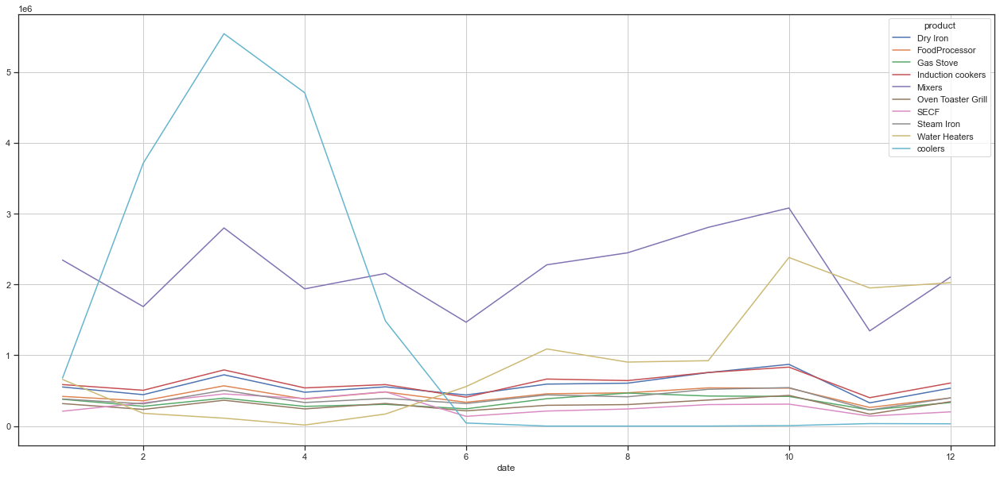

In [260]:
fig, ax = plt.subplots(figsize=(22,10))
monthly_sales_across_products.plot(ax=ax)
plt.grid();

In [261]:
yearly_sales_across_products = pd.pivot_table(c1, values = 'sales', columns = c1["product"], index = c1.index.year)
yearly_sales_across_products

product,Dry Iron,FoodProcessor,Gas Stove,Induction cookers,Mixers,Oven Toaster Grill,SECF,Steam Iron,Water Heaters,coolers
date,,,,,,,,,,
2014,393299.188889,608199.211111,199239.355556,532015.922222,1.698971e+06,218561.988889,109243.600000,453921.966667,6.765506e+05,5.280453e+05
2015,452086.391667,457410.991667,309680.108333,563719.391667,2.161553e+06,240483.708333,194058.058333,377219.325000,6.154218e+05,9.842197e+05
2016,561425.700000,344263.875000,359046.166667,564832.891667,2.207126e+06,293831.441667,325562.291667,312460.333333,1.122906e+06,1.140527e+06
2017,815428.516667,398834.650000,461742.216667,746355.741667,2.607318e+06,412788.250000,397566.541667,469684.608333,1.295164e+06,1.675238e+06
2018,672689.433333,311233.033333,394639.300000,664465.366667,2.259682e+06,360213.400000,550008.000000,379890.133333,4.526909e+05,4.871532e+06


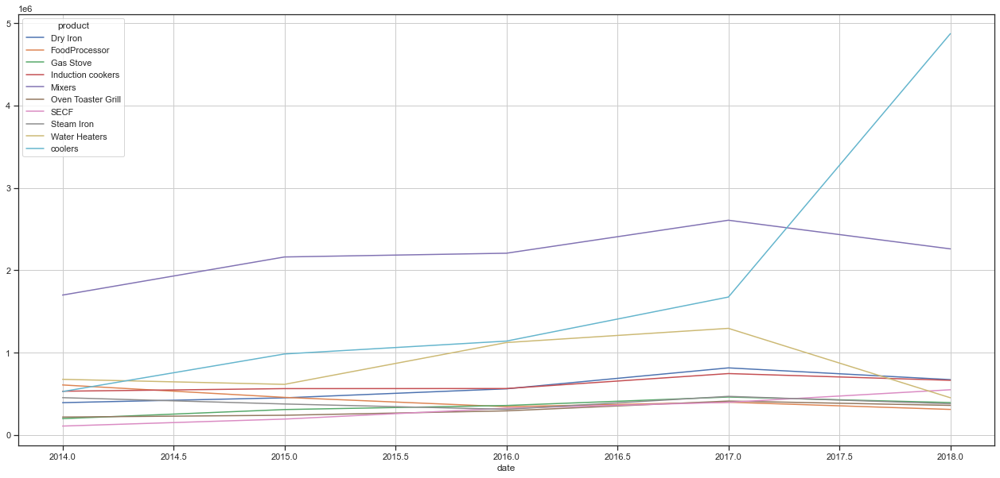

In [262]:
fig, ax = plt.subplots(figsize=(22,10))
yearly_sales_across_products.plot(ax=ax)
plt.grid();

In [263]:
monthly_sales_across_city = pd.pivot_table(c1, values = 'sales', columns = c1["city"], index = c1.index.month)
monthly_sales_across_city

city,Ahmd,Bangalore,Chennai,Cochin,Delhi,Hyderabad,Kolkata,Mumbai,Patna,Pune
date,,,,,,,,,,
1,540257.850,794617.450,450124.900,516333.800,217561.350,653381.025,1093032.875,1467719.125,319087.725,472491.125
2,705664.500,972904.050,1085185.400,758382.050,272077.100,790853.300,1004487.425,1569617.150,310560.850,572480.600
3,1052860.025,1499300.875,1610778.175,1120859.250,417470.175,1212311.825,1549758.400,2420557.475,479817.075,889001.175
4,811362.850,1133904.175,1317377.525,891466.900,321310.150,913191.275,1108499.550,1776143.475,354809.325,671520.975
5,545894.475,847909.850,589384.425,586969.600,229833.150,714514.850,1010967.600,1556555.150,298637.700,551213.925
6,347820.800,506332.175,226237.575,311542.200,137167.475,421015.950,717719.550,983284.950,206733.850,306500.075
7,556059.525,775591.825,355898.875,494668.250,208180.750,641376.150,1127054.700,1459589.650,329129.325,463123.275
8,540214.900,781235.700,337919.625,504822.775,212402.975,654999.050,1146432.650,1507515.650,332600.525,474075.400
9,603674.400,903252.225,375649.000,561507.275,245015.275,750484.725,1293967.700,1735600.450,377357.625,548733.275


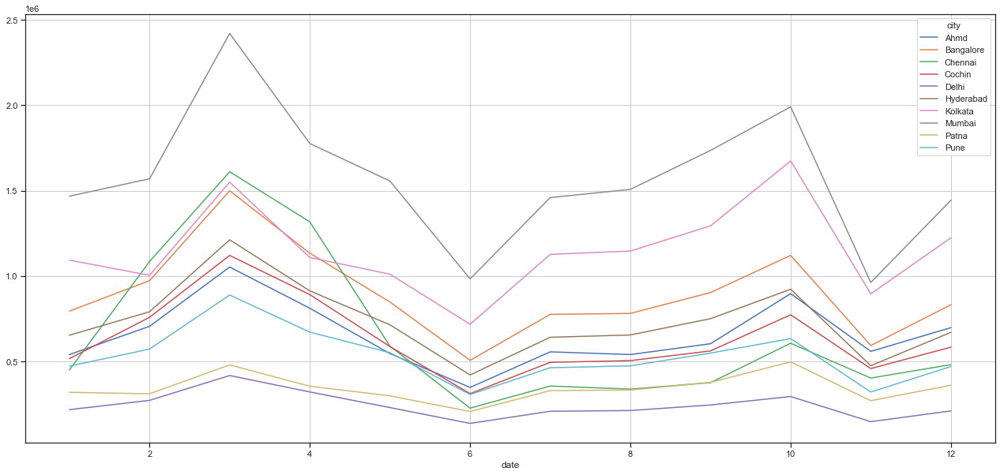

In [264]:
fig, ax = plt.subplots(figsize=(22,10))
monthly_sales_across_city.plot(ax=ax)
plt.grid();

In [265]:
yearly_sales_across_cities = pd.pivot_table(c1, values = 'sales', columns = c1["city"], index = c1.index.year)
yearly_sales_across_cities

city,Ahmd,Bangalore,Chennai,Cochin,Delhi,Hyderabad,Kolkata,Mumbai,Patna,Pune
date,,,,,,,,,,
2014,456879.933333,7.967114e+05,4.449541e+05,313763.655556,141057.444444,5.321532e+05,7.019037e+05,1.367128e+06,170623.166667,492873.555556
2015,560656.308333,8.693478e+05,5.834449e+05,410665.608333,181116.433333,6.564005e+05,8.430755e+05,1.420025e+06,244642.433333,586478.666667
2016,772540.075000,9.042241e+05,5.906881e+05,904698.291667,242383.058333,6.513423e+05,9.158082e+05,1.402067e+06,299796.433333,548433.466667
2017,732729.441667,9.443280e+05,7.968965e+05,729361.625000,342964.375000,9.631265e+05,1.794626e+06,1.934108e+06,546100.991667,495880.283333
2018,842303.666667,1.086640e+06,1.233092e+06,961688.966667,395019.266667,1.080113e+06,2.140969e+06,2.039036e+06,641605.600000,496577.833333


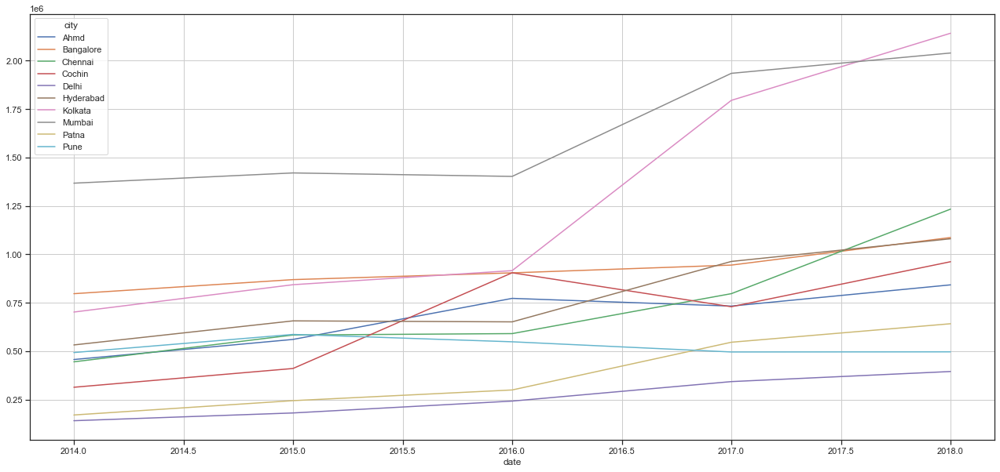

In [266]:
fig, ax = plt.subplots(figsize=(22,10))
yearly_sales_across_cities.plot(ax=ax)
plt.grid();

In [311]:
#Let us extract some additional features
#Creating separate columns for 'Year','Month','Day' and 'WeekofYear'
c1['Year'] = c1.index.year
c1['Month'] = c1.index.month
c1['Day'] = c1.index.day
c1['WeekOfYear'] = c1.index.weekofyear
c1["Quarter"]=c1.index.quarter
c1.head()

,product,city,sales,Year,Month,Day,WeekOfYear,Quarter
date,,,,,,,,
2014-04-01,Mixers,Mumbai,2679347,2014,4,1,14,2
2014-05-01,Mixers,Mumbai,3864612,2014,5,1,18,2
2014-06-01,Mixers,Mumbai,2932658,2014,6,1,22,2
2014-07-01,Mixers,Mumbai,3703713,2014,7,1,27,3
2014-08-01,Mixers,Mumbai,3931029,2014,8,1,31,3


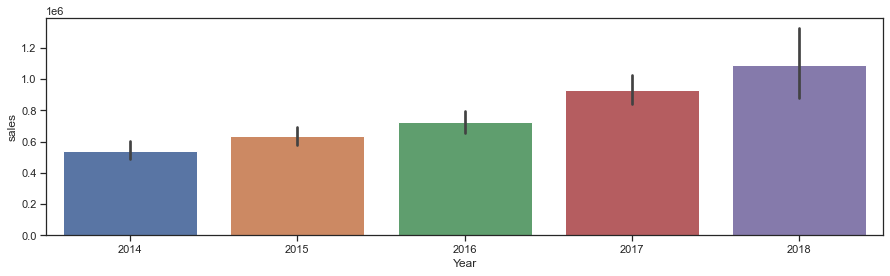

In [268]:
## Plot average Sales for every year
fig, (axis1) = plt.subplots(1,figsize=(15,4))

sns.barplot(x='Year', y='sales', data=c1, ax=axis1);

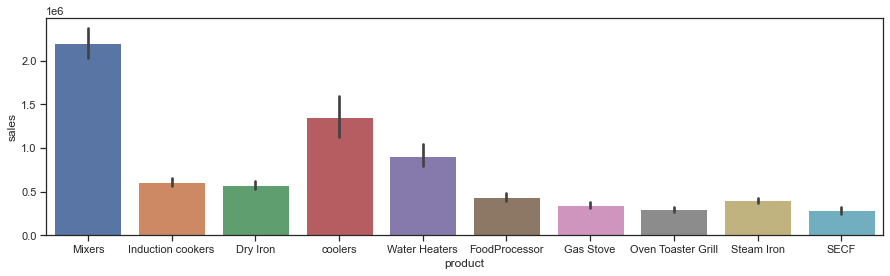

In [20]:
## Plot average Sales for every year
fig, (axis1) = plt.subplots(1,figsize=(15,4))

sns.barplot(x='product', y='sales', data=c1, ax=axis1);

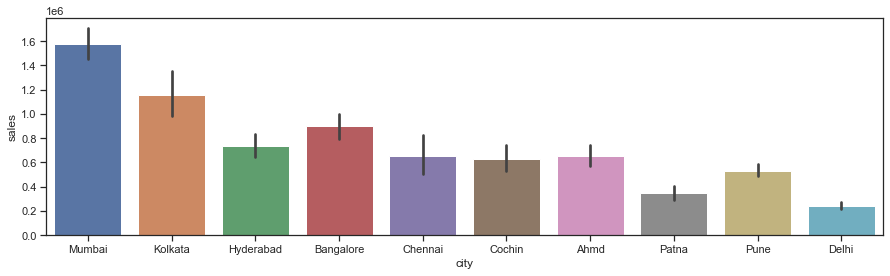

In [22]:
## Plot average Sales for every year
fig, (axis1) = plt.subplots(1,figsize=(15,4))

sns.barplot(x='city', y='sales', data=c1, ax=axis1);

In [41]:
c1[(c1['city'] == 'Ahmd') & (c1.Month== 2)& (c1.Year== 2014)]

,product,city,sales,Year,Month,Day,WeekOfYear
date,,,,,,,


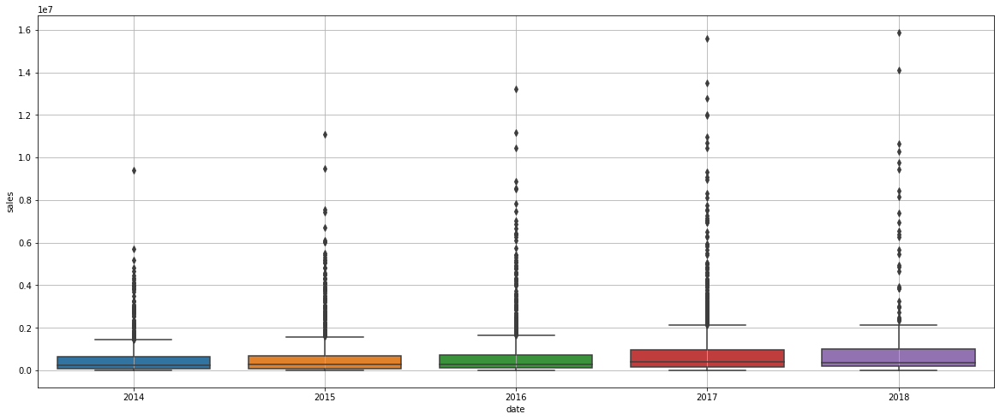

In [44]:
sns.boxplot(x = c1.index.year,y = c1['sales'])
plt.grid();

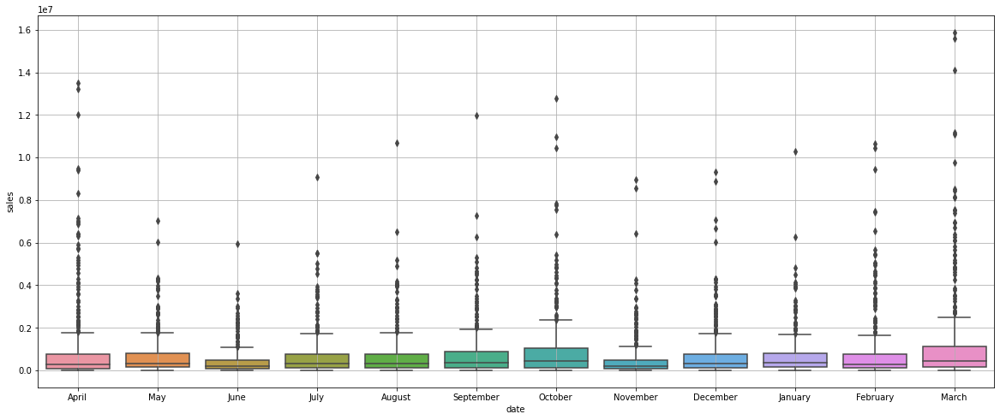

In [45]:
sns.boxplot(x = c1.index.month_name(),y = c1['sales'])
plt.grid();

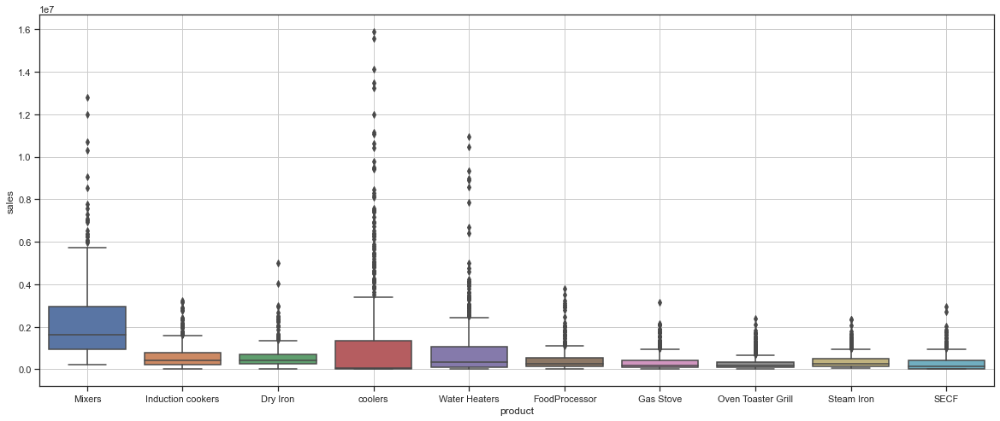

In [21]:
sns.boxplot(x = c1['product'],y = c1['sales'])
plt.grid();

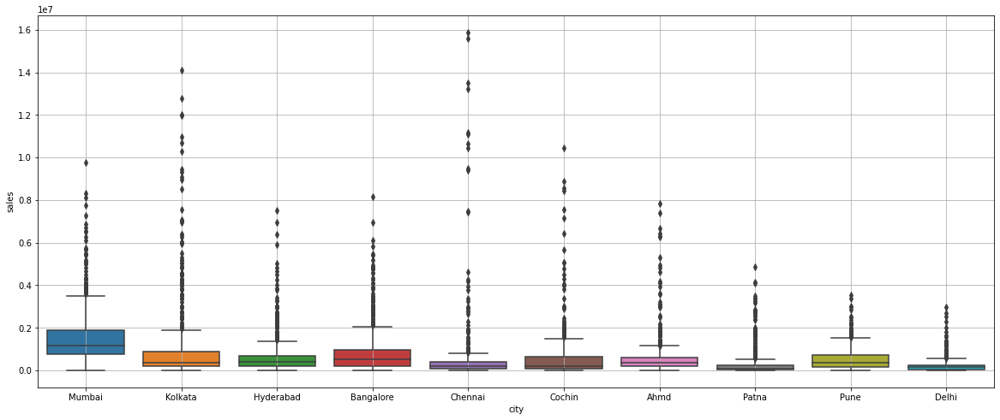

In [67]:
sns.boxplot(x = c1['city'],y = c1['sales'])
plt.grid();

In [93]:
c1.interpolate(method='linear')["sales"]

date
2014-04-01    2679347
2014-05-01    3864612
2014-06-01    2932658
2014-07-01    3703713
2014-08-01    3931029
               ...   
2017-11-01       5837
2017-12-01       7451
2018-01-01       7712
2018-02-01      31525
2018-03-01      36136
Name: sales, Length: 4800, dtype: int64

In [23]:
from    statsmodels.tsa.seasonal import   seasonal_decompose

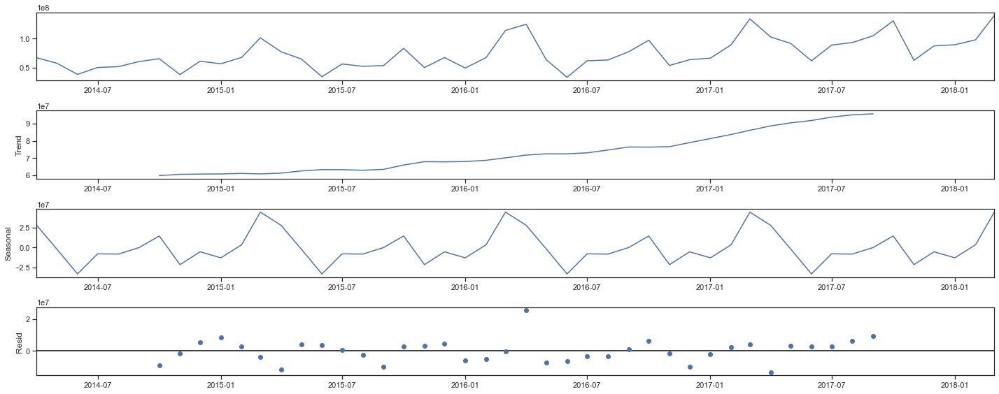

In [24]:
decomposition11 = seasonal_decompose(c3,model='additive')
decomposition11.plot();

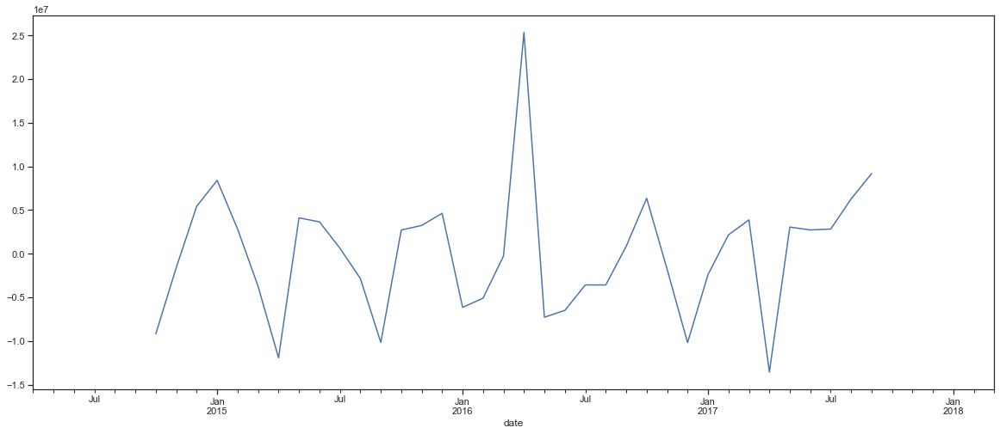

In [25]:
decomposition11.resid.plot()
plt.show()

In [28]:
trend = decomposition11.trend
seasonality = decomposition11.seasonal
residual = decomposition11.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 date
2014-04-01             NaN
2014-05-01             NaN
2014-06-01             NaN
2014-07-01             NaN
2014-08-01             NaN
2014-09-01             NaN
2014-10-01    5.982893e+07
2014-11-01    6.056826e+07
2014-12-01    6.070994e+07
2015-01-01    6.079902e+07
2015-02-01    6.107776e+07
2015-03-01    6.080920e+07
Name: trend, dtype: float64 

Seasonality 
 date
2014-04-01    2.784974e+07
2014-05-01   -1.817429e+06
2014-06-01   -3.296431e+07
2014-07-01   -7.814666e+06
2014-08-01   -8.119865e+06
2014-09-01    1.067211e+04
2014-10-01    1.450523e+07
2014-11-01   -2.133488e+07
2014-12-01   -5.294895e+06
2015-01-01   -1.281546e+07
2015-02-01    3.481098e+06
2015-03-01    4.431476e+07
Name: seasonal, dtype: float64 

Residual 
 date
2014-04-01             NaN
2014-05-01             NaN
2014-06-01             NaN
2014-07-01             NaN
2014-08-01             NaN
2014-09-01             NaN
2014-10-01   -9.169896e+06
2014-11-01   -1.572084e+06
2014-12-01    5.440625e+0

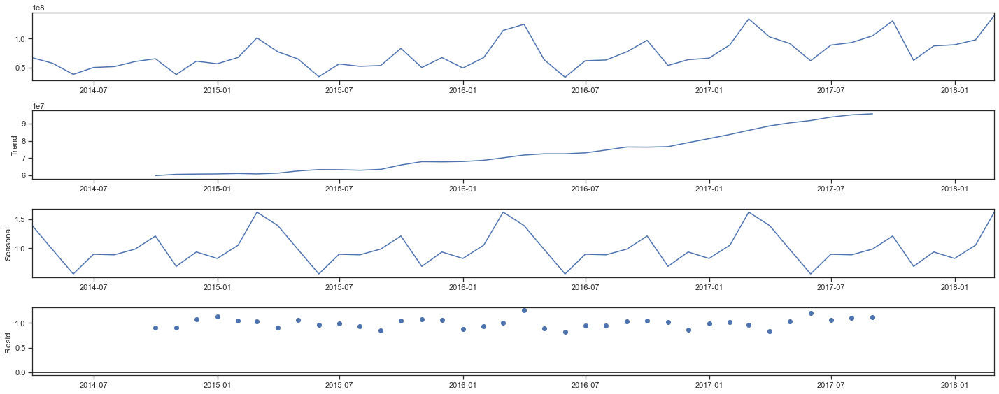

In [26]:
decomposition12 = seasonal_decompose(c3,model='multiplicative')
decomposition12.plot();

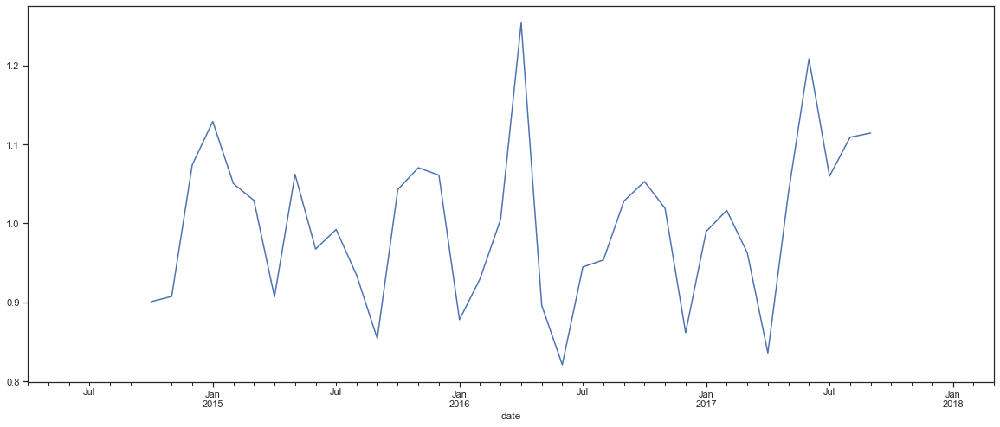

In [27]:
decomposition12.resid.plot()
plt.show()

In [29]:
trend = decomposition12.trend
seasonality = decomposition12.seasonal
residual = decomposition12.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 date
2014-04-01             NaN
2014-05-01             NaN
2014-06-01             NaN
2014-07-01             NaN
2014-08-01             NaN
2014-09-01             NaN
2014-10-01    5.982893e+07
2014-11-01    6.056826e+07
2014-12-01    6.070994e+07
2015-01-01    6.079902e+07
2015-02-01    6.107776e+07
2015-03-01    6.080920e+07
Name: trend, dtype: float64 

Seasonality 
 date
2014-04-01    1.389074
2014-05-01    0.975934
2014-06-01    0.554942
2014-07-01    0.893359
2014-08-01    0.884286
2014-09-01    0.983520
2014-10-01    1.208948
2014-11-01    0.685253
2014-12-01    0.933160
2015-01-01    0.821456
2015-02-01    1.050094
2015-03-01    1.619975
Name: seasonal, dtype: float64 

Residual 
 date
2014-04-01         NaN
2014-05-01         NaN
2014-06-01         NaN
2014-07-01         NaN
2014-08-01         NaN
2014-09-01         NaN
2014-10-01    0.900929
2014-11-01    0.907401
2014-12-01    1.074200
2015-01-01    1.129121
2015-02-01    1.050531
2015-03-01    1.029226
Name: resid, 

# Additonal EDA : Project notes 2

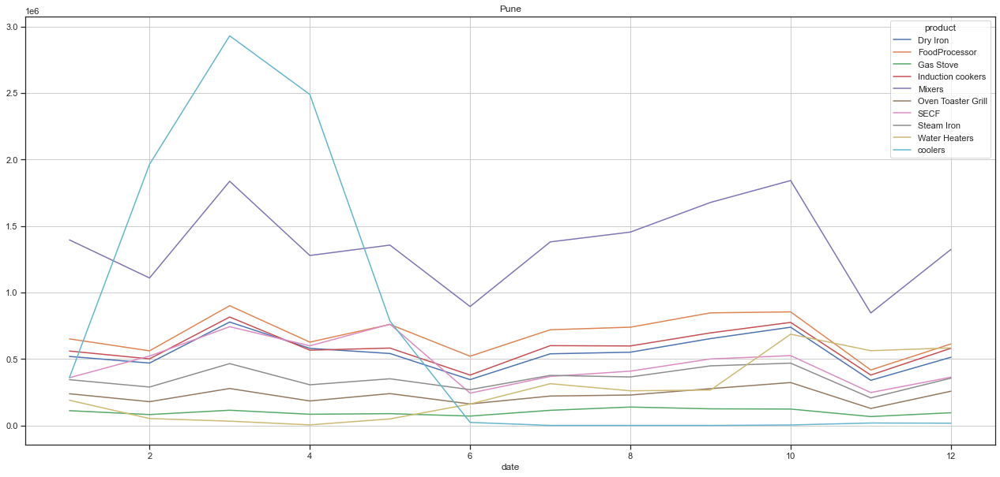

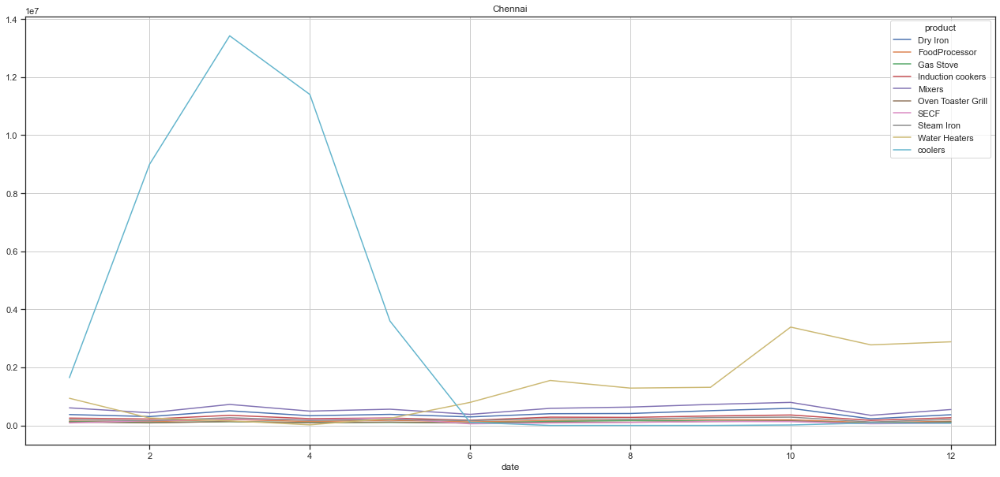

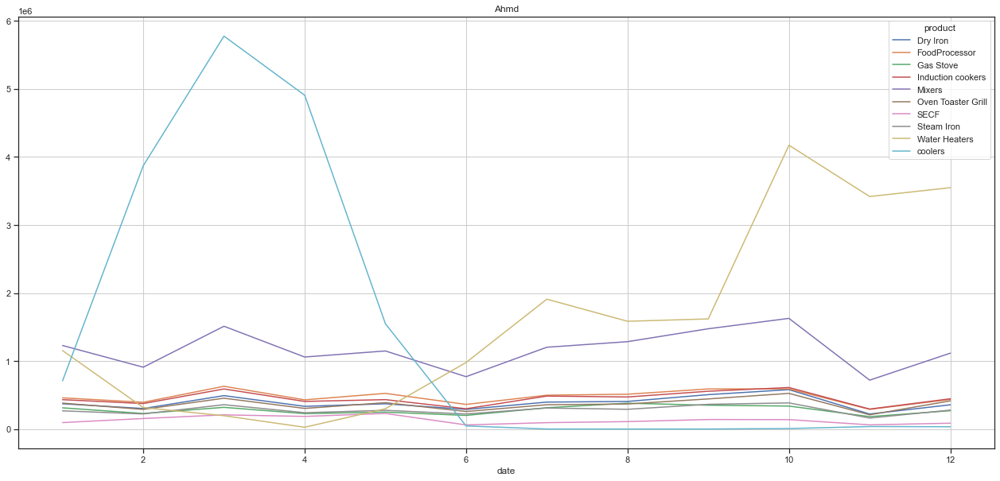

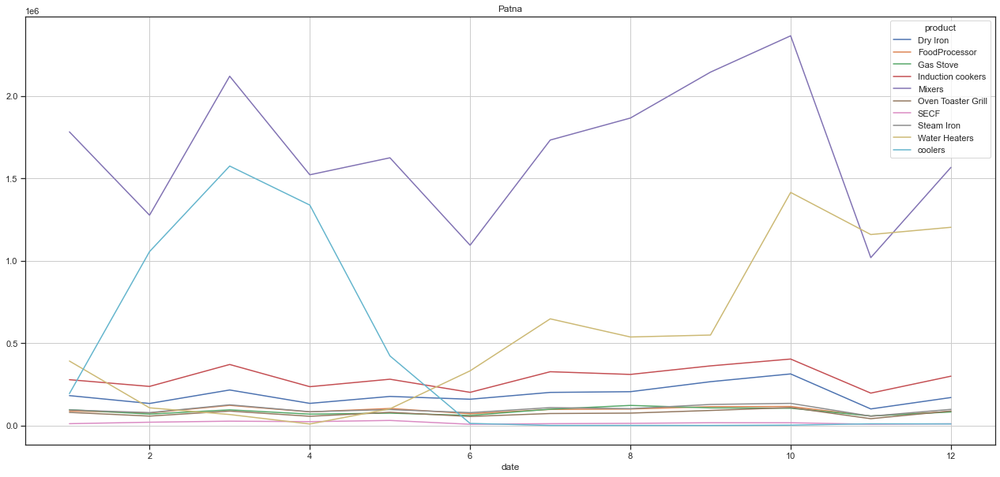

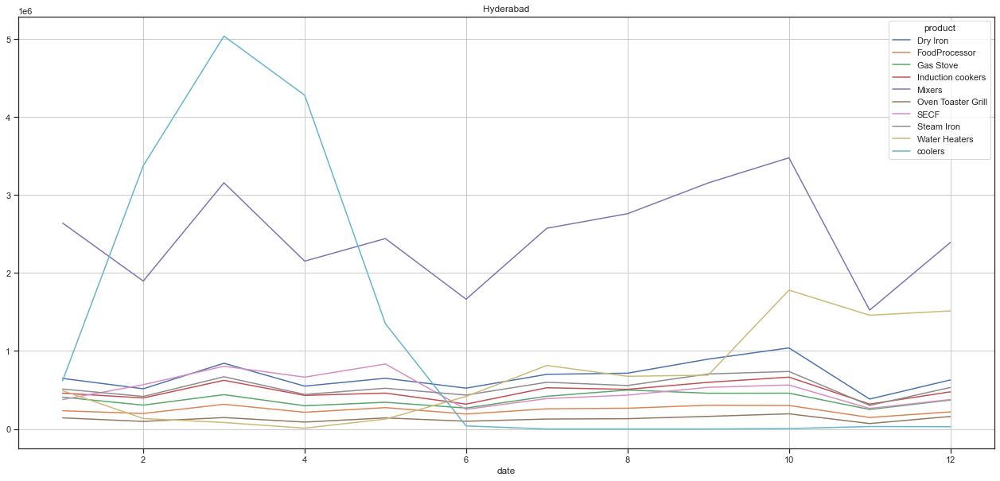

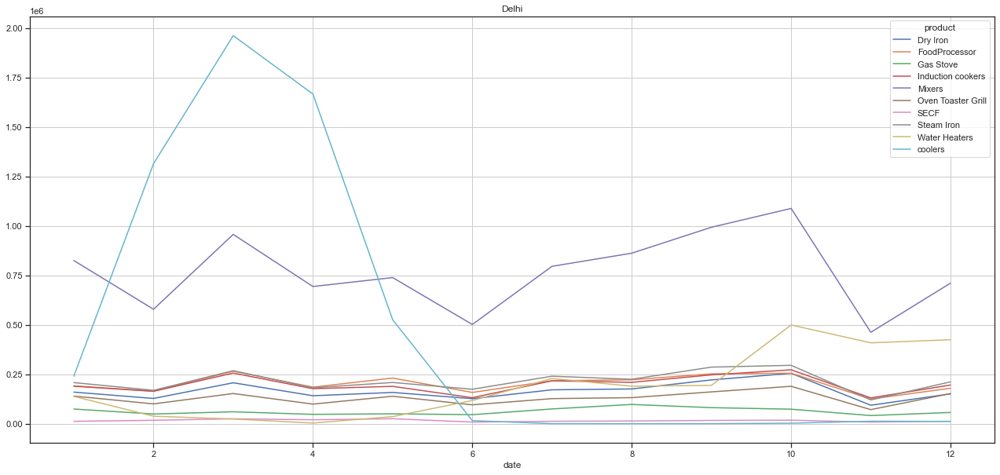

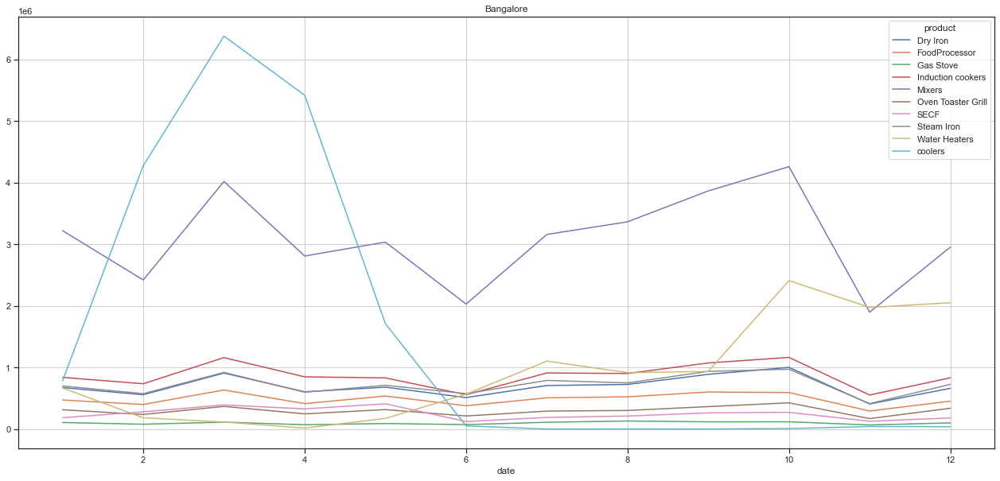

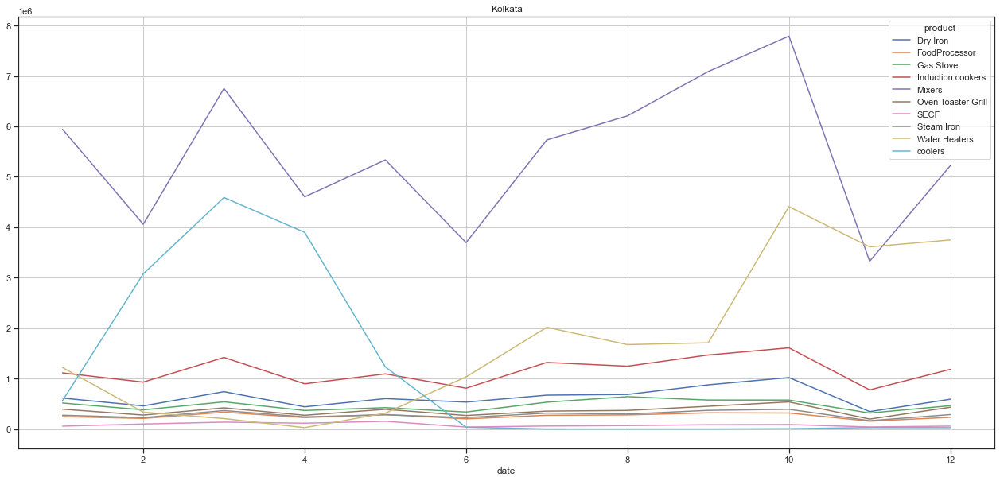

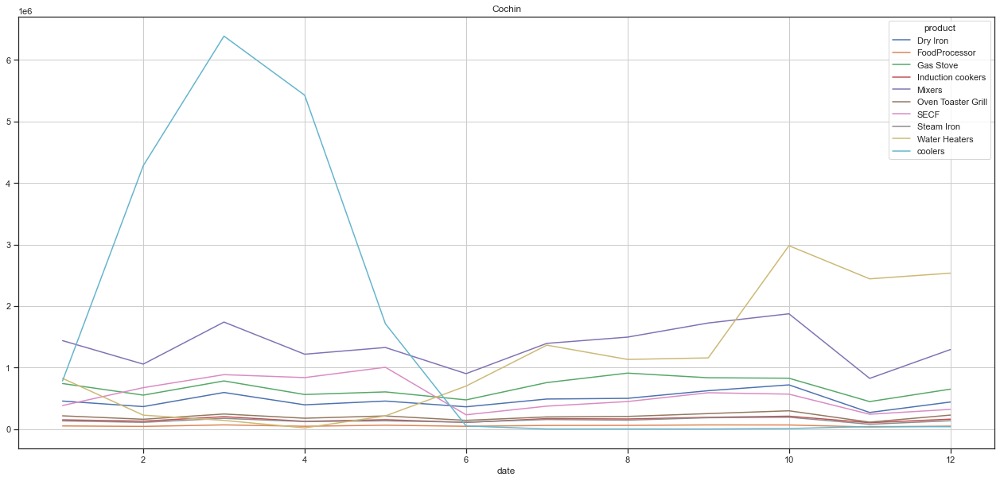

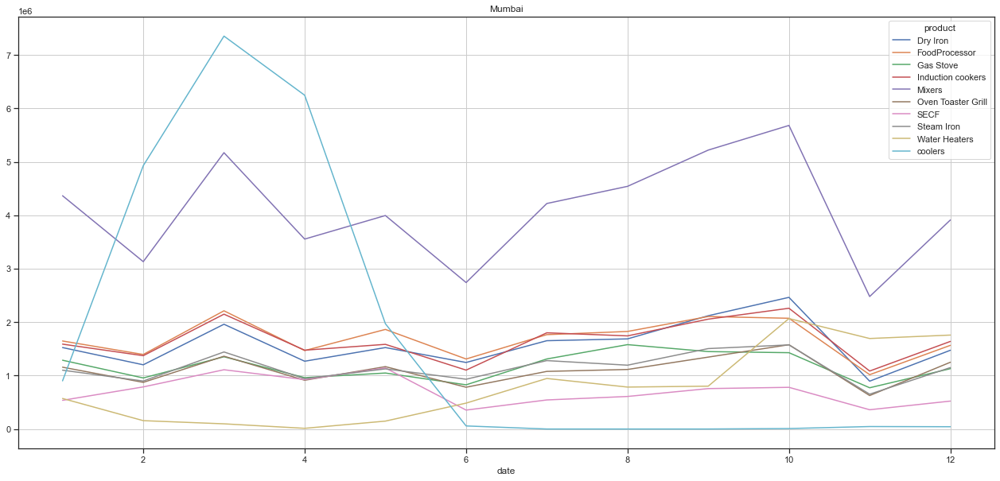

In [312]:
cols=["Pune","Chennai","Ahmd","Patna","Hyderabad","Delhi","Bangalore","Kolkata","Cochin","Mumbai"]
for i in cols:
    to_plot=c2[c2['city']== i]
    monthly_sales_across_products = pd.pivot_table(to_plot, values = 'sales', columns = to_plot["product"], index = to_plot.index.month)
    fig, ax = plt.subplots(figsize=(22,10))
    monthly_sales_across_products.plot(ax=ax)
    plt.title(i)
    plt.grid();

In [65]:
c1

,product,city,sales,Year,Month,Day,WeekOfYear,Quarter
date,,,,,,,,
2014-04-01,Mixers,Mumbai,2679347,2014,4,1,14,2
2014-05-01,Mixers,Mumbai,3864612,2014,5,1,18,2
2014-06-01,Mixers,Mumbai,2932658,2014,6,1,22,2
2014-07-01,Mixers,Mumbai,3703713,2014,7,1,27,3
2014-08-01,Mixers,Mumbai,3931029,2014,8,1,31,3
...,...,...,...,...,...,...,...,...
2017-11-01,SECF,Delhi,5837,2017,11,1,44,4
2017-12-01,SECF,Delhi,7451,2017,12,1,48,4
2018-01-01,SECF,Delhi,7712,2018,1,1,1,1


In [74]:
cY=pd.DataFrame(c1.groupby(["Year"])["sales"].sum())
cY.head()

,sales
Year,
2014,487624369
2015,762702353
2016,867837748
2017,1113614516
2018,327511333


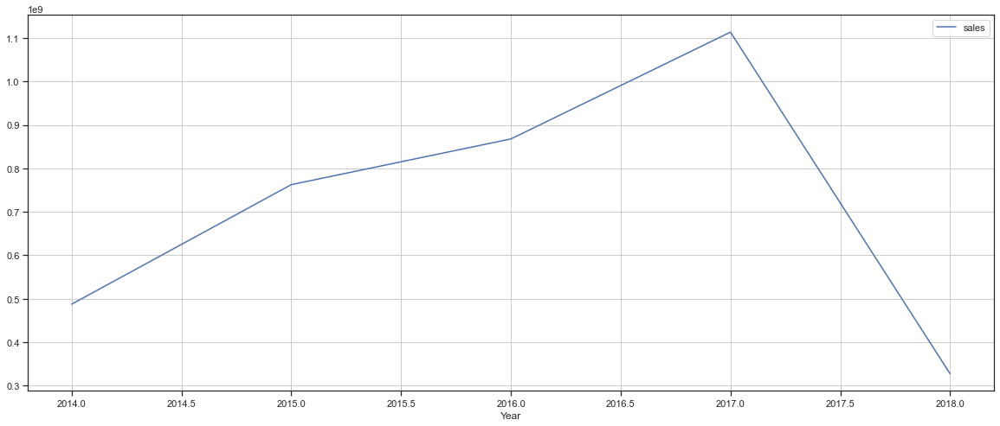

In [75]:
cY.plot()
plt.grid()

In [76]:
cm=pd.DataFrame(c1.groupby(["Month"])["sales"].sum())
cm.head()

,sales
Month,
1,260984289
2,321688497
3,490108578
4,371983448
5,277275229


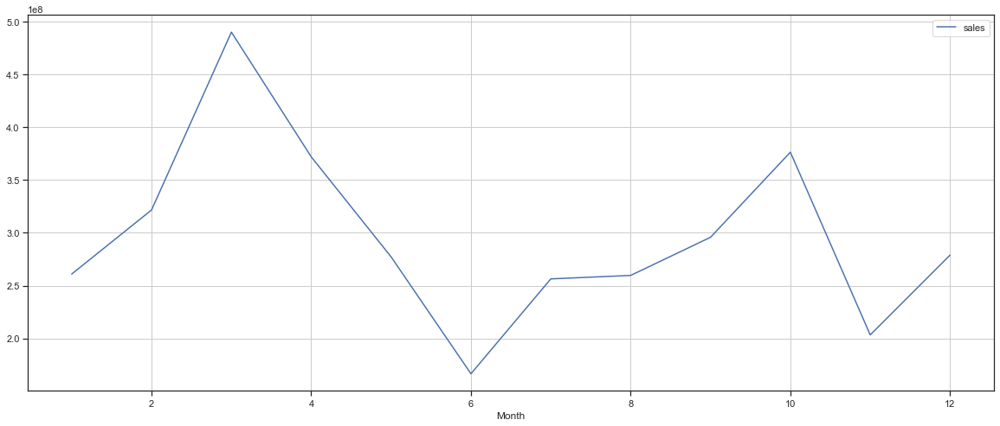

In [77]:
cm.plot()
plt.grid()

In [78]:
cw=pd.DataFrame(c1.groupby(["WeekOfYear"])["sales"].sum())
cw.head()

,sales
WeekOfYear,
1,145822064
5,321688497
9,490108578
13,227907946
14,144075502


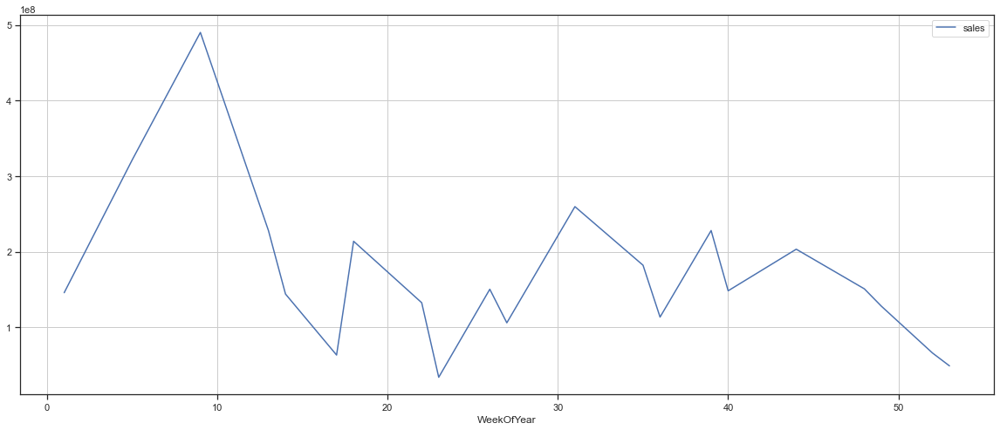

In [79]:
cw.plot()
plt.grid()

In [80]:
cq=pd.DataFrame(c1.groupby(["Quarter"])["sales"].sum())
cq.head()

,sales
Quarter,
1,1072781364
2,815832861
3,811925341
4,858750753


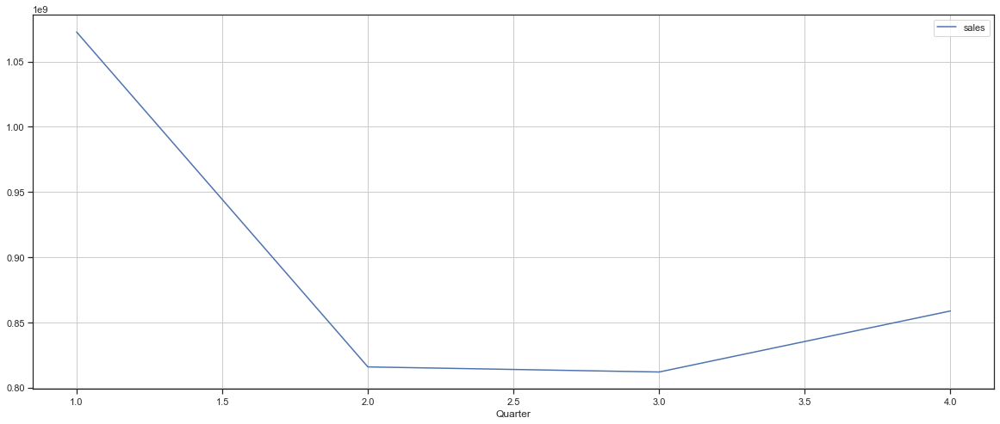

In [81]:
cq.plot()
plt.grid()

In [2]:
cp1 = pd.read_csv('data_t10.csv',parse_dates=True,index_col='date')
cp1.head()

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347
2014-05-01,Mixers,Mumbai,3864612
2014-06-01,Mixers,Mumbai,2932658
2014-07-01,Mixers,Mumbai,3703713
2014-08-01,Mixers,Mumbai,3931029


In [313]:
cpp=pd.DataFrame(c1.groupby(["Quarter","city"])["sales"].sum()).reset_index()
cpp.head()

,Quarter,city,sales
0,1,Ahmd,91951295
1,1,Bangalore,130672895
2,1,Chennai,125843539
3,1,Cochin,95823004
4,1,Delhi,36284345


In [121]:
monthly_sales_q[1]

sales    91951295
Name: 1, dtype: int64

In [163]:
too_plot=cpp[cpp['city']== "Ahmd"]
monthly_sales_q = pd.pivot_table(too_plot, values = 'sales', columns = too_plot["Quarter"])
monthly_sales_q =pd.DataFrame(monthly_sales_q)
monthly_sales_q=(monthly_sales_q).T
monthly_sales_q.reset_index(inplace=True)
fig = px.line(monthly_sales_q, x="Quarter", y="sales")
fig.show()

In [314]:
cols=["Pune","Chennai","Ahmd","Patna","Hyderabad","Delhi","Bangalore","Kolkata","Cochin","Mumbai"]
for i in cols:
    too_plot=cpp[cpp['city']== i]
    monthly_sales_q = pd.pivot_table(too_plot, values = 'sales', columns = too_plot["Quarter"])
    monthly_sales_q =pd.DataFrame(monthly_sales_q)
    monthly_sales_q=(monthly_sales_q).T
    monthly_sales_q.reset_index(inplace=True)
    fig = px.line(monthly_sales_q, x="Quarter", y="sales",title=i)
    fig.show()

In [165]:
cpp=pd.DataFrame(c1.groupby(["Year","city"])["sales"].sum()).reset_index()
cpp.head()

,Year,city,sales
0,2014,Ahmd,41119194
1,2014,Bangalore,71704022
2,2014,Chennai,40045865
3,2014,Cochin,28238729
4,2014,Delhi,12695170


In [166]:
cols=["Pune","Chennai","Ahmd","Patna","Hyderabad","Delhi","Bangalore","Kolkata","Cochin","Mumbai"]
for i in cols:
    too_plot=cpp[cpp['city']== i]
    monthly_sales_q = pd.pivot_table(too_plot, values = 'sales', columns = too_plot["Year"])
    monthly_sales_q =pd.DataFrame(monthly_sales_q)
    monthly_sales_q=(monthly_sales_q).T
    monthly_sales_q.reset_index(inplace=True)
    fig = px.line(monthly_sales_q, x="Year", y="sales",title=i)
    fig.show()

In [167]:
cpp=pd.DataFrame(c1.groupby(["WeekOfYear","city"])["sales"].sum()).reset_index()
cpp.head()

,WeekOfYear,city,sales
0,1,Ahmd,10812038
1,1,Bangalore,17076049
2,1,Chennai,9764042
3,1,Cochin,9441020
4,1,Delhi,4839451


In [168]:
cols=["Pune","Chennai","Ahmd","Patna","Hyderabad","Delhi","Bangalore","Kolkata","Cochin","Mumbai"]
for i in cols:
    too_plot=cpp[cpp['city']== i]
    monthly_sales_q = pd.pivot_table(too_plot, values = 'sales', columns = too_plot["WeekOfYear"])
    monthly_sales_q =pd.DataFrame(monthly_sales_q)
    monthly_sales_q=(monthly_sales_q).T
    monthly_sales_q.reset_index(inplace=True)
    fig = px.line(monthly_sales_q, x="WeekOfYear", y="sales",title=i)
    fig.show()

In [5]:
cpp=pd.DataFrame(c1.groupby(["Month","city"])["sales"].sum()).reset_index()
cpp.head()

NameError: name 'c1' is not defined

In [170]:
cols=["Pune","Chennai","Ahmd","Patna","Hyderabad","Delhi","Bangalore","Kolkata","Cochin","Mumbai"]
for i in cols:
    too_plot=cpp[cpp['city']== i]
    monthly_sales_q = pd.pivot_table(too_plot, values = 'sales', columns = too_plot["Month"])
    monthly_sales_q =pd.DataFrame(monthly_sales_q)
    monthly_sales_q=(monthly_sales_q).T
    monthly_sales_q.reset_index(inplace=True)
    fig = px.line(monthly_sales_q, x="Month", y="sales",title=i)
    fig.show()

In [193]:
## Test for stationarity of the series - Dicky Fuller test

from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=12).mean() #determining the rolling mean
    rolstd = timeseries.rolling(window=12).std()   #determining the rolling standard deviation

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

In [198]:
cp1

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347
2014-05-01,Mixers,Mumbai,3864612
2014-06-01,Mixers,Mumbai,2932658
2014-07-01,Mixers,Mumbai,3703713
2014-08-01,Mixers,Mumbai,3931029
...,...,...,...
2017-11-01,SECF,Delhi,5837
2017-12-01,SECF,Delhi,7451
2018-01-01,SECF,Delhi,7712


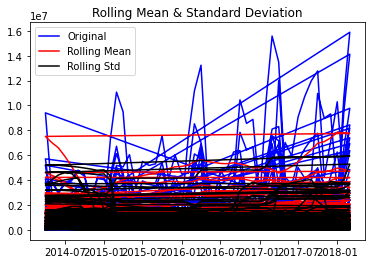

Results of Dickey-Fuller Test:
Test Statistic                -7.522009e+00
p-value                        3.769164e-11
#Lags Used                     3.200000e+01
Number of Observations Used    4.767000e+03
Critical Value (1%)           -3.431723e+00
Critical Value (5%)           -2.862147e+00
Critical Value (10%)          -2.567093e+00
dtype: float64 



In [196]:
test_stationarity(cp1['sales'])

In [185]:
cpadf=pd.DataFrame(cp1.groupby(["date","city"])["sales"].sum()).reset_index()
cpadf.head()

,date,city,sales
0,2014-04-01,Ahmd,6299069
1,2014-04-01,Bangalore,9791615
2,2014-04-01,Chennai,10559954
3,2014-04-01,Cochin,5578723
4,2014-04-01,Delhi,1697065


In [190]:
cpadf.set_index(["date"],inplace=True)
cpadf

,city,sales
date,,
2014-04-01,Ahmd,6299069
2014-04-01,Bangalore,9791615
2014-04-01,Chennai,10559954
2014-04-01,Cochin,5578723
2014-04-01,Delhi,1697065
...,...,...
2018-03-01,Hyderabad,13612259
2018-03-01,Kolkata,25856449
2018-03-01,Mumbai,24328271


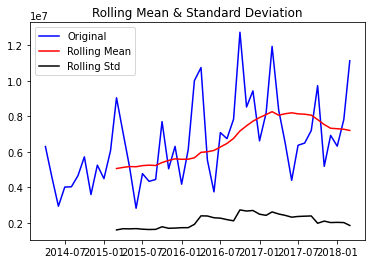

Results of Dickey-Fuller Test:
Test Statistic                 -3.734033
p-value                         0.003659
#Lags Used                      0.000000
Number of Observations Used    47.000000
Critical Value (1%)            -3.577848
Critical Value (5%)            -2.925338
Critical Value (10%)           -2.600774
dtype: float64 



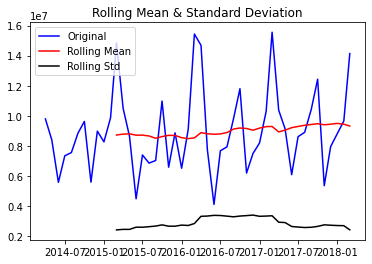

Results of Dickey-Fuller Test:
Test Statistic                 -2.590431
p-value                         0.094991
#Lags Used                     10.000000
Number of Observations Used    37.000000
Critical Value (1%)            -3.620918
Critical Value (5%)            -2.943539
Critical Value (10%)           -2.610400
dtype: float64 



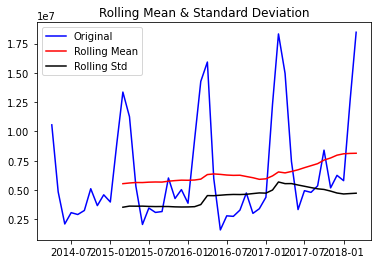

Results of Dickey-Fuller Test:
Test Statistic                 -0.359160
p-value                         0.916698
#Lags Used                     10.000000
Number of Observations Used    37.000000
Critical Value (1%)            -3.620918
Critical Value (5%)            -2.943539
Critical Value (10%)           -2.610400
dtype: float64 



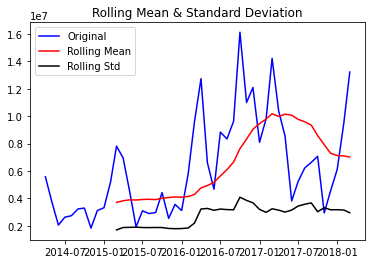

Results of Dickey-Fuller Test:
Test Statistic                 -2.332633
p-value                         0.161659
#Lags Used                      0.000000
Number of Observations Used    47.000000
Critical Value (1%)            -3.577848
Critical Value (5%)            -2.925338
Critical Value (10%)           -2.600774
dtype: float64 



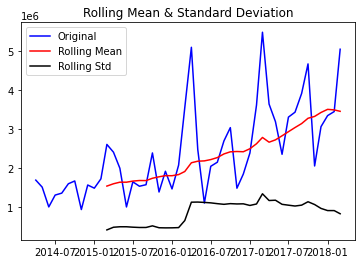

Results of Dickey-Fuller Test:
Test Statistic                 -0.228490
p-value                         0.935039
#Lags Used                     10.000000
Number of Observations Used    37.000000
Critical Value (1%)            -3.620918
Critical Value (5%)            -2.943539
Critical Value (10%)           -2.610400
dtype: float64 



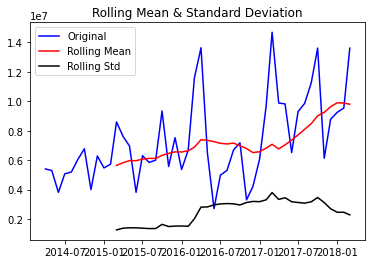

Results of Dickey-Fuller Test:
Test Statistic                 -1.264660
p-value                         0.645182
#Lags Used                      4.000000
Number of Observations Used    43.000000
Critical Value (1%)            -3.592504
Critical Value (5%)            -2.931550
Critical Value (10%)           -2.604066
dtype: float64 



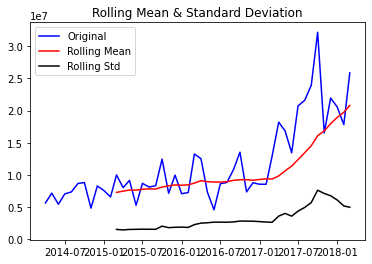

Results of Dickey-Fuller Test:
Test Statistic                 -2.052716
p-value                         0.263948
#Lags Used                      7.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64 



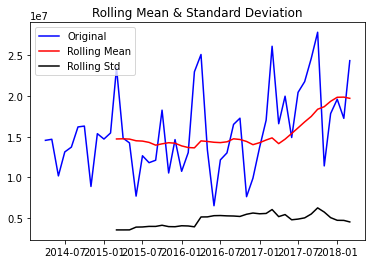

Results of Dickey-Fuller Test:
Test Statistic                 -2.103421
p-value                         0.243141
#Lags Used                      7.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64 



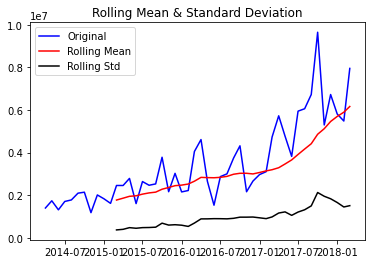

Results of Dickey-Fuller Test:
Test Statistic                 -0.961585
p-value                         0.767016
#Lags Used                      7.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64 



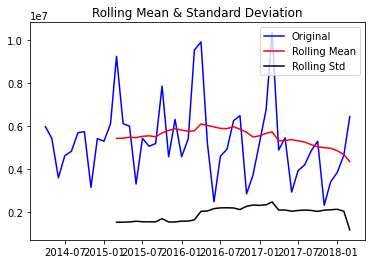

Results of Dickey-Fuller Test:
Test Statistic                 -2.921893
p-value                         0.042861
#Lags Used                      7.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64 



In [199]:
for city in cpadf["city"].unique():
    cptest1 = cpadf[(cpadf['city']== city)]
    test_stationarity(cptest1['sales'])

In [315]:
cp1['city'].unique()  

array(['Mumbai', 'Kolkata', 'Hyderabad', 'Bangalore', 'Chennai', 'Cochin',
       'Ahmd', 'Patna', 'Pune', 'Delhi'], dtype=object)

In [316]:
cp1['product'].unique()

array(['Mixers', 'Induction cookers', 'Dry Iron', 'coolers',
       'Water Heaters', 'FoodProcessor', 'Gas Stove',
       'Oven Toaster Grill', 'Steam Iron', 'SECF'], dtype=object)

In [317]:
cp2=cp1[(cp1['city']=='Chennai') & (cp1["product"]== "coolers")]

In [318]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [13]:
train.drop("city",axis=1,inplace=True)

In [14]:
test.drop("city",axis=1,inplace=True)

In [15]:
len(train)

33

In [16]:
len(test)

15

In [22]:
 model_TESs = ExponentialSmoothing(train['sales'],trend='additive',seasonal="additive",seasonal_periods=12)      

In [23]:
model_TES_autofits = model_TESs.fit()

In [24]:
model_TES_autofits.params

{'smoothing_level': 0.040357142857142855,
 'smoothing_trend': 0.0001,
 'smoothing_seasonal': 0.9596428571428571,
 'damping_trend': nan,
 'initial_level': 10706497.666666666,
 'initial_trend': 1917.284722222222,
 'initial_seasons': array([ -1301915.66666667,  -7739803.66666667, -10620275.66666667,
        -10706497.66666667, -10706497.66666667, -10706497.66666667,
        -10693731.66666667, -10637159.66666667, -10642488.66666667,
         -9349980.66666667,  -3287388.66666667,    364270.33333333]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [25]:
model_TES_autofits

In [26]:
## Prediction on the test data

test['auto_predict'] = model_TES_autofits.forecast(steps=len(test))
test.head()

,product,sales,auto_predict
date,,,
2017-01-01,coolers,1908340,1.536090e+06
2017-02-01,coolers,10437161,7.648505e+06
2017-03-01,coolers,15574294,1.132832e+07
2017-04-01,coolers,13491138,1.324341e+07
2017-05-01,coolers,4255806,4.145893e+06


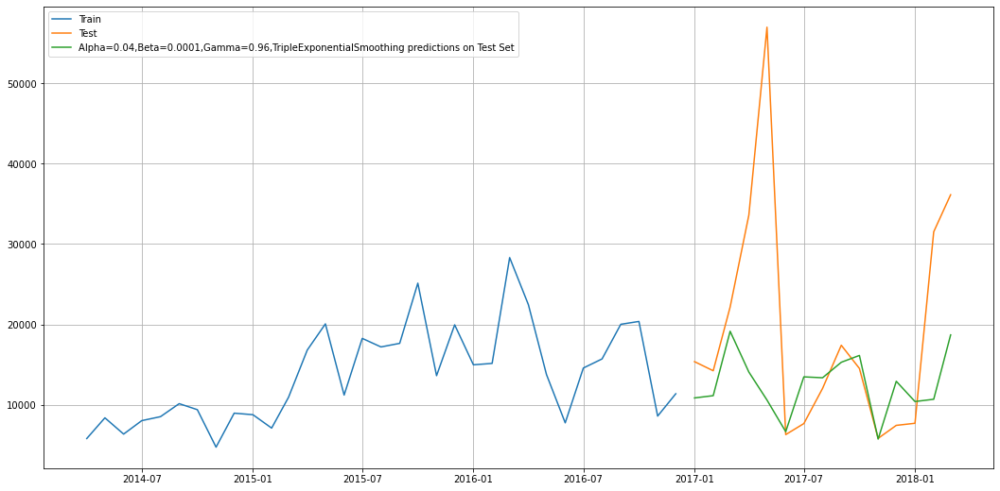

In [201]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(train['sales'], label='Train')
plt.plot(test['sales'], label='Test')

plt.plot(test['auto_predict'], label='Alpha=0.04,Beta=0.0001,Gamma=0.96,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid();

In [320]:
from sklearn import metrics

In [322]:
resultsDf=[]

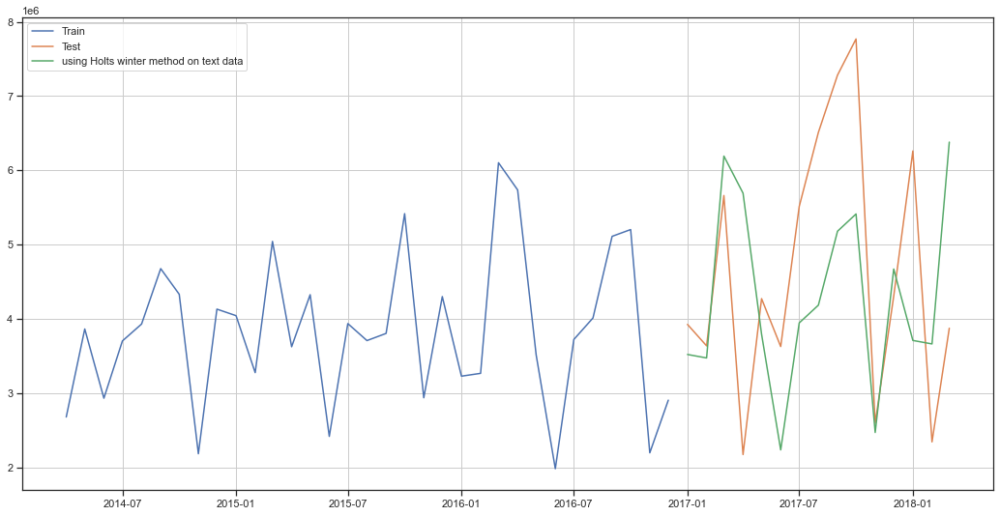

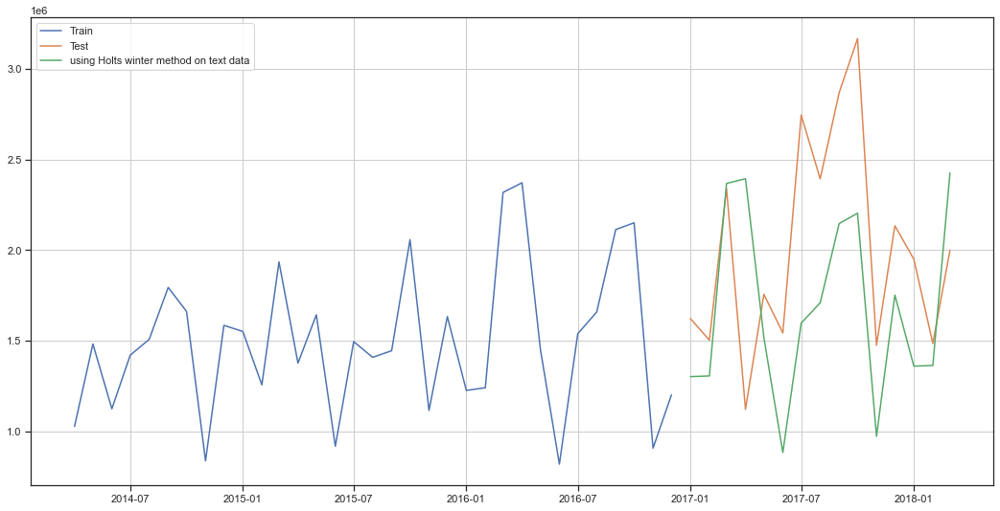

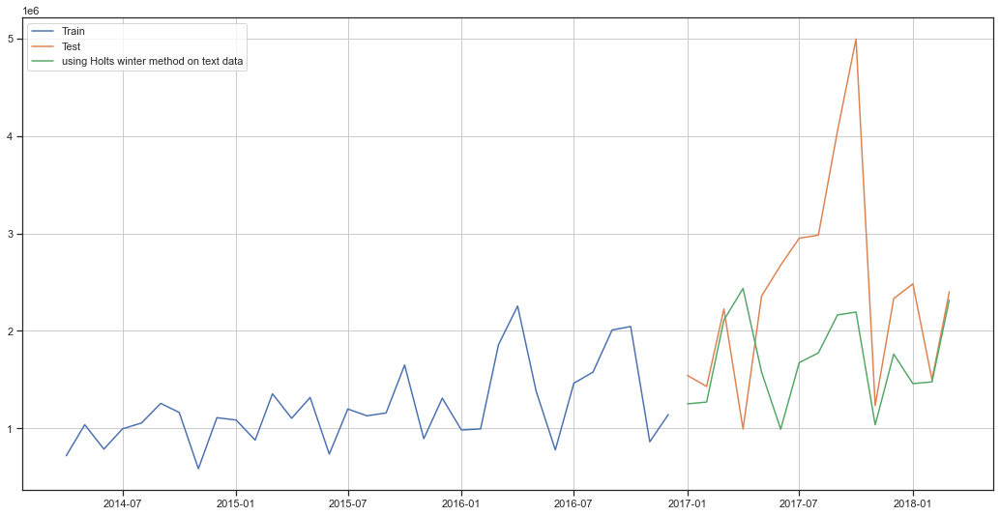

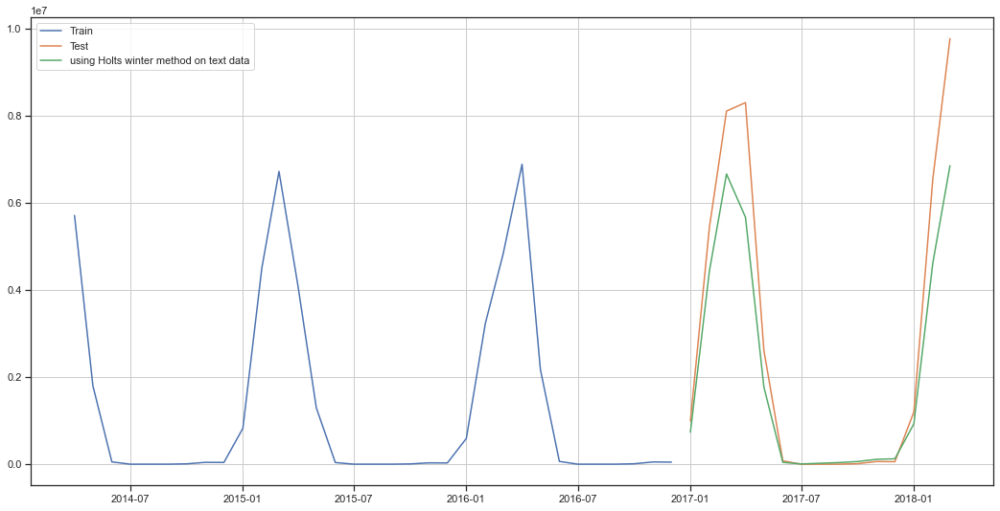

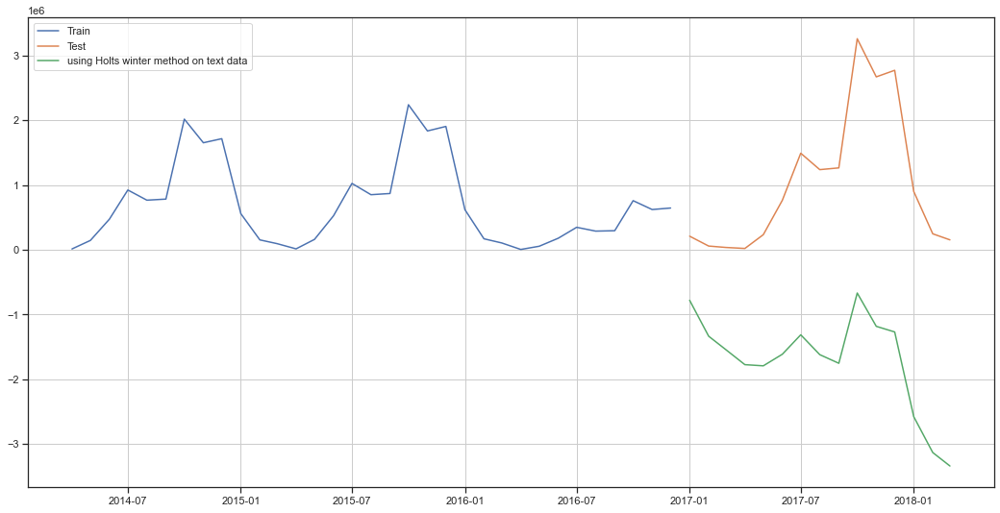

...

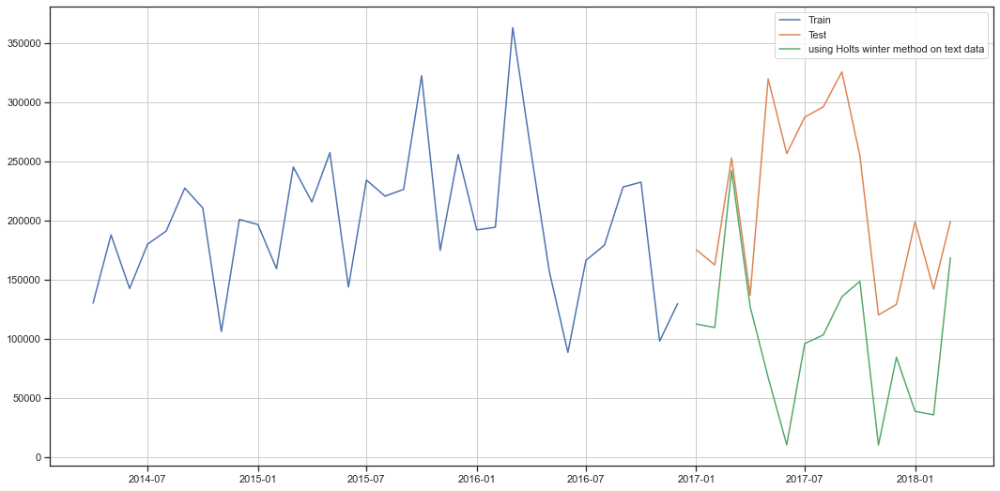

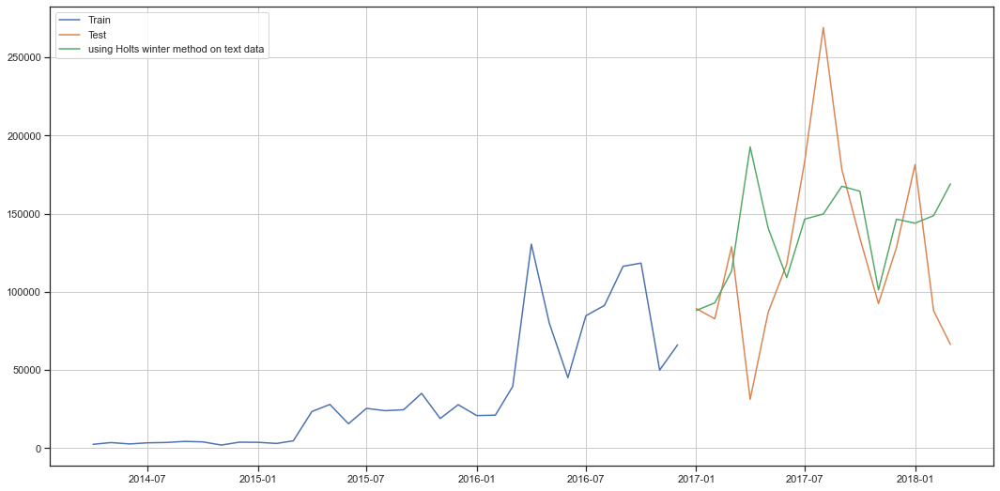

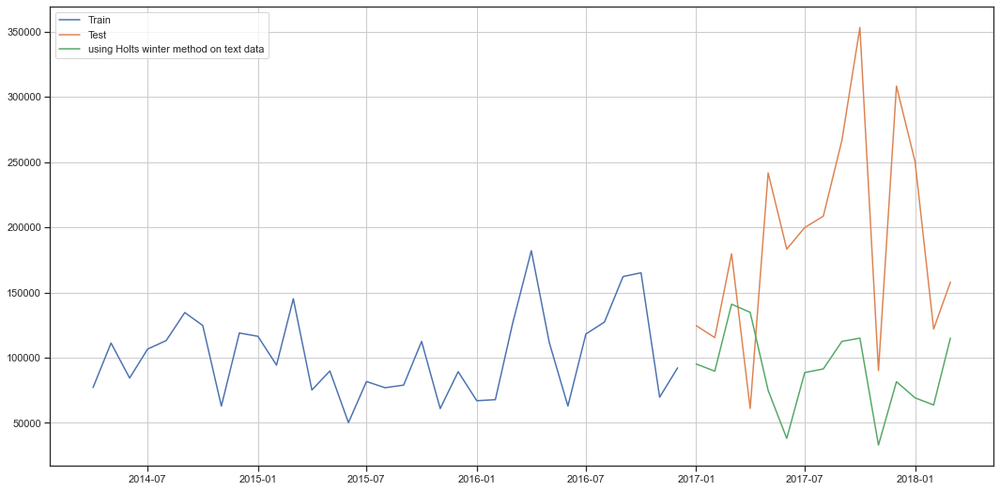

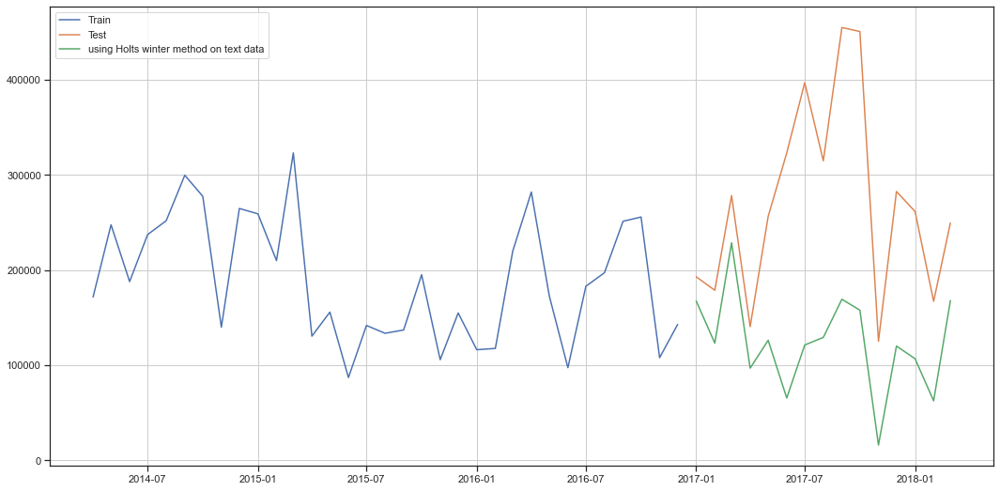

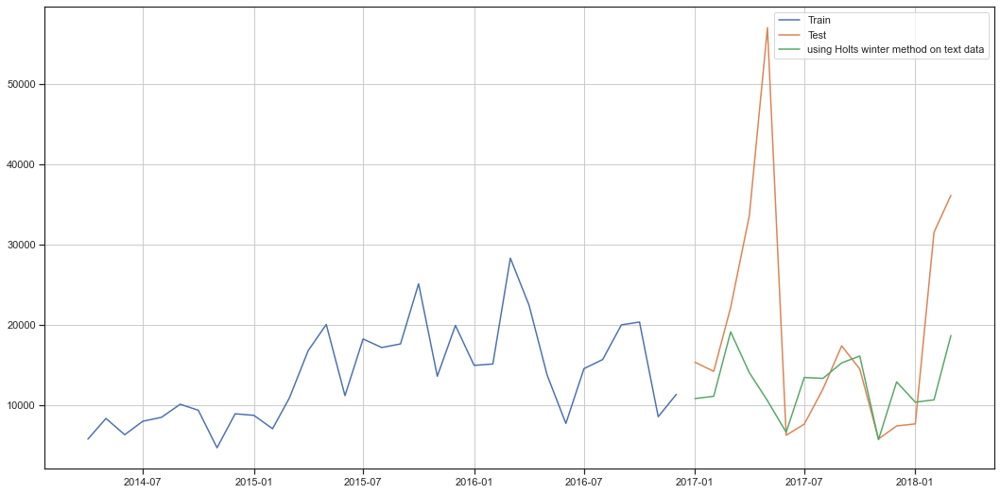

In [323]:
for city in  cp1['city'].unique():
    for prod in cp1['product'].unique():
        cp2=cp1[(cp1['city']== city) & (cp1["product"]== prod)]
        train    =   cp2[0:int(len(cp2)*0.7)] 
        test     =   cp2[int(len(cp2)*0.7):]
        model_TESs = ExponentialSmoothing(train['sales'],trend='additive',seasonal='additive',seasonal_periods=12)
        model_TES_autofits = model_TESs.fit()
        test['auto_predict'] = model_TES_autofits.forecast(steps=len(test))
        plt.figure(figsize=(18,9))
        plt.plot(train['sales'], label='Train')
        plt.plot(test['sales'], label='Test')
        plt.plot(test['auto_predict'], label='using Holts winter method on text data')
        plt.legend(loc='best')
        plt.grid();
        rmse_mode_test_tr = metrics.mean_squared_error(test['sales'],test['auto_predict'],squared=False)
        resultsDf.append(rmse_mode_test_tr)

In [324]:
Avg= mean(resultsDf)
Avg

963399.861758344

In [8]:
cp1

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347
2014-05-01,Mixers,Mumbai,3864612
2014-06-01,Mixers,Mumbai,2932658
2014-07-01,Mixers,Mumbai,3703713
2014-08-01,Mixers,Mumbai,3931029
...,...,...,...
2017-11-01,SECF,Delhi,5837
2017-12-01,SECF,Delhi,7451
2018-01-01,SECF,Delhi,7712


In [3]:
cp2=cp1[(cp1['city']=='Chennai')].groupby("city")

In [4]:
cp3=pd.DataFrame(cp1.groupby(["date","city"])["sales"].sum()).reset_index()
cp3.head()

,date,city,sales
0,2014-04-01,Ahmd,6299069
1,2014-04-01,Bangalore,9791615
2,2014-04-01,Chennai,10559954
3,2014-04-01,Cochin,5578723
4,2014-04-01,Delhi,1697065


In [5]:
cp3.set_index(["date"],inplace= True)

In [13]:
cp3

,city,sales
date,,
2014-04-01,Ahmd,6299069
2014-04-01,Bangalore,9791615
2014-04-01,Chennai,10559954
2014-04-01,Cochin,5578723
2014-04-01,Delhi,1697065
...,...,...
2018-03-01,Hyderabad,13612259
2018-03-01,Kolkata,25856449
2018-03-01,Mumbai,24328271


In [47]:
cp3['city'].unique()

array(['Ahmd', 'Bangalore', 'Chennai', 'Cochin', 'Delhi', 'Hyderabad',
       'Kolkata', 'Mumbai', 'Patna', 'Pune'], dtype=object)

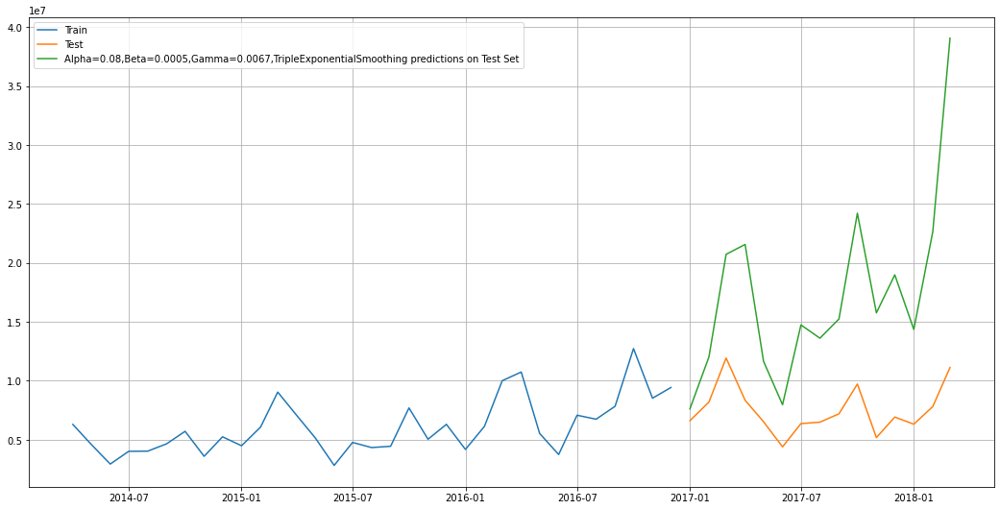

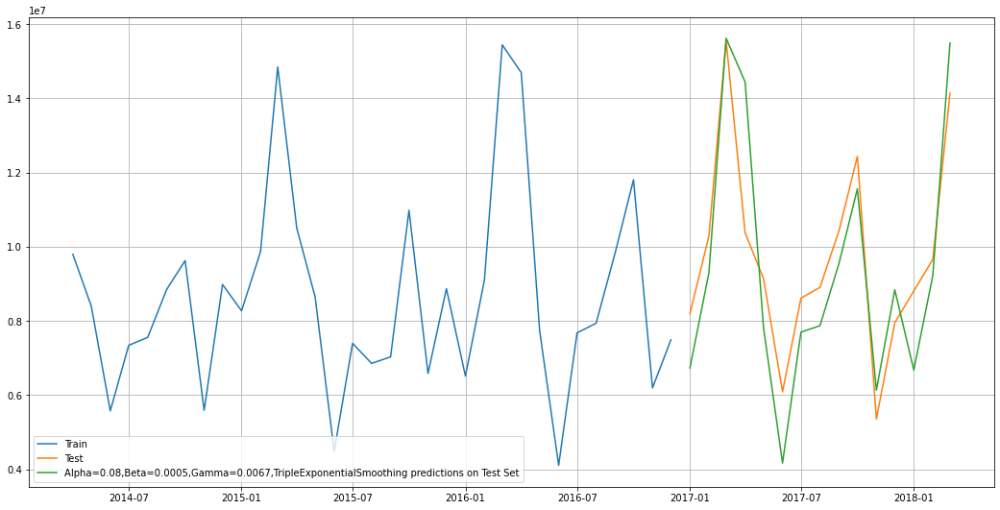

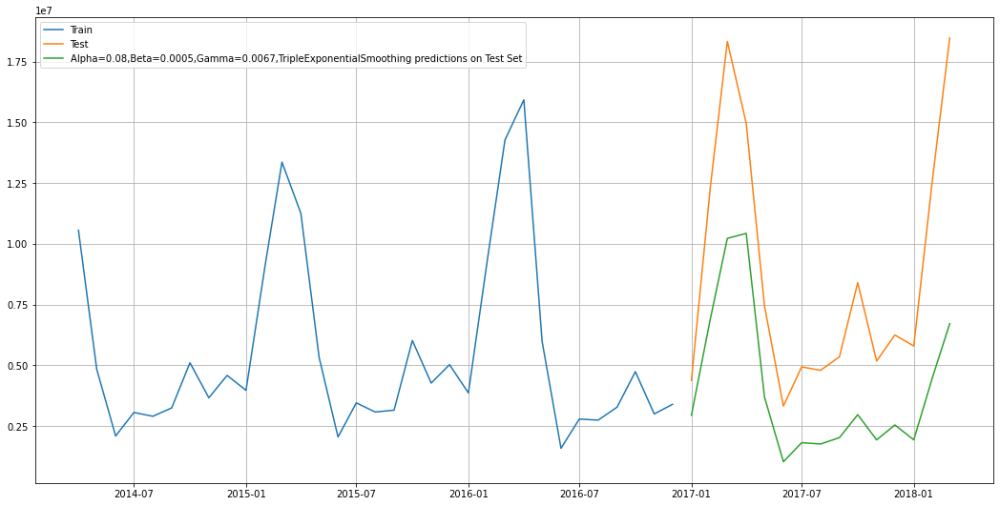

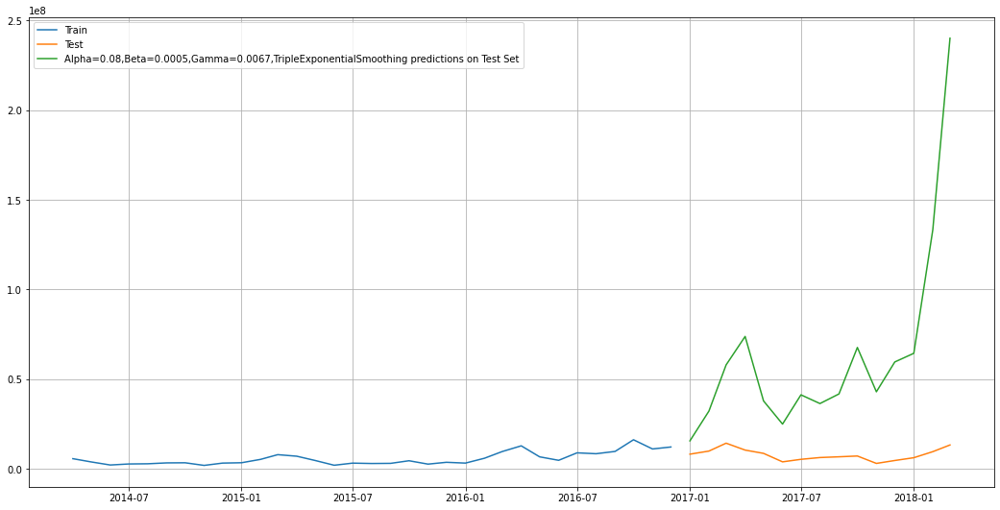

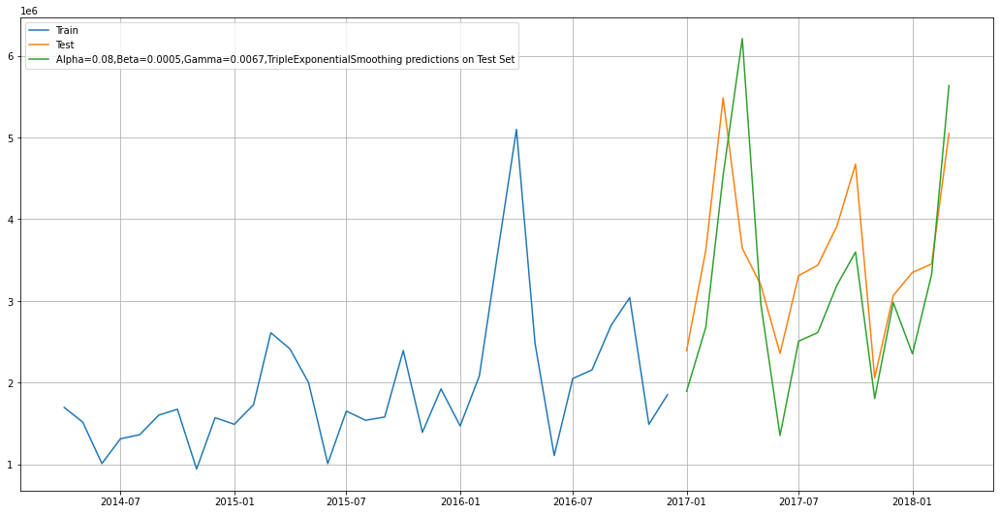

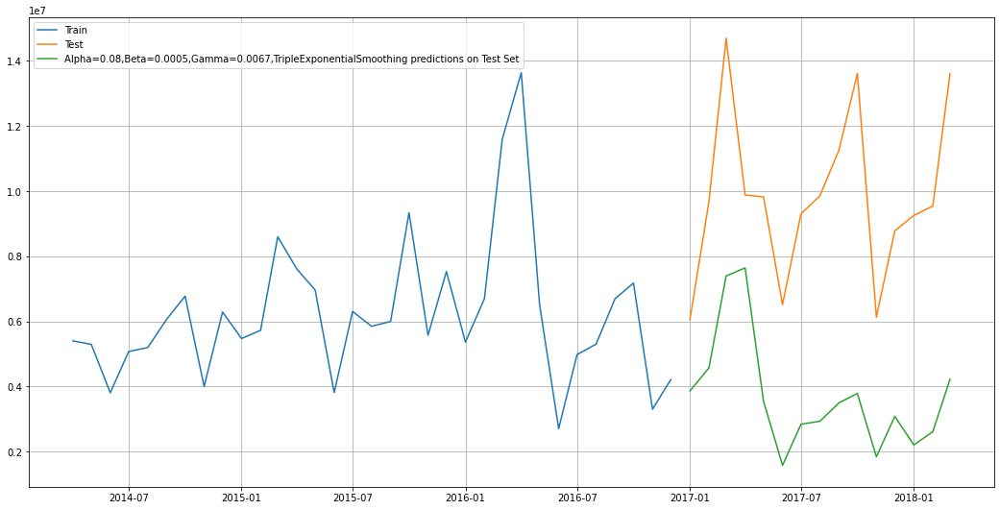

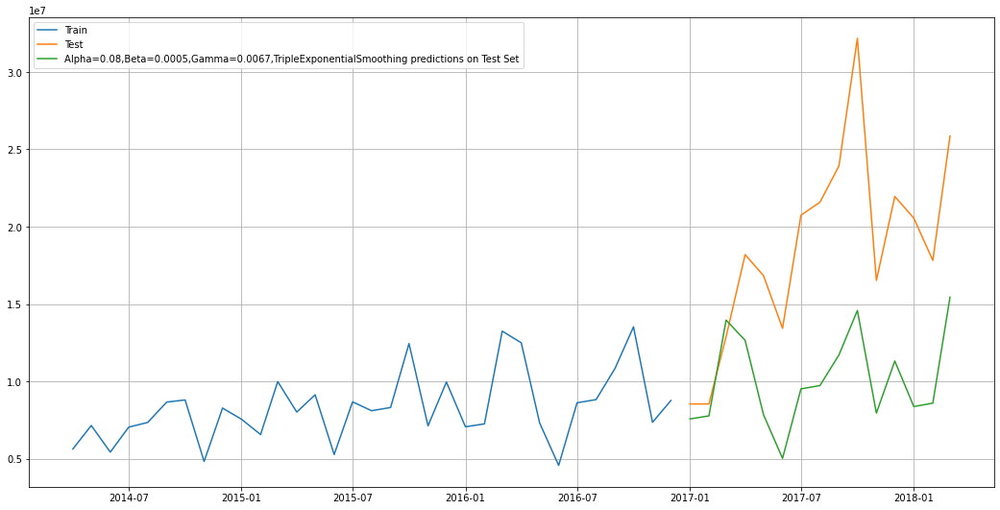

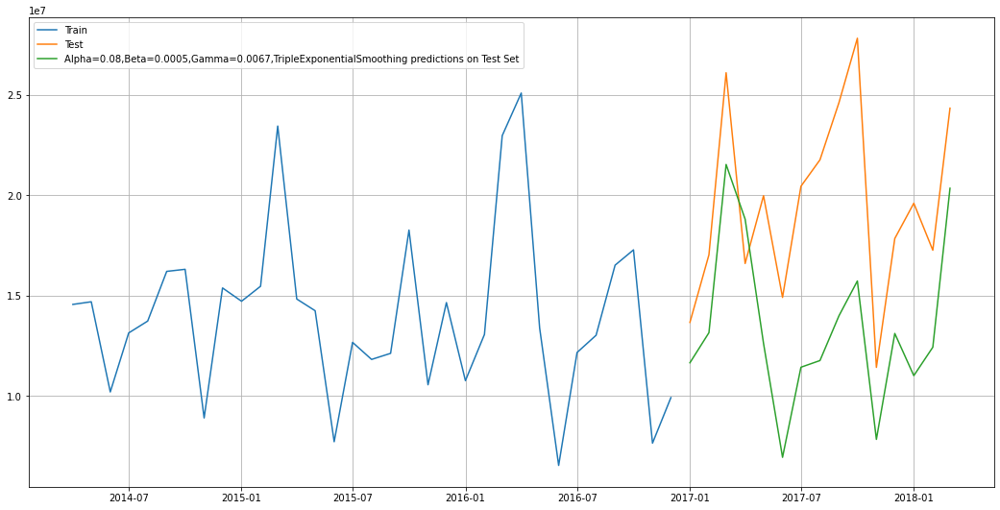

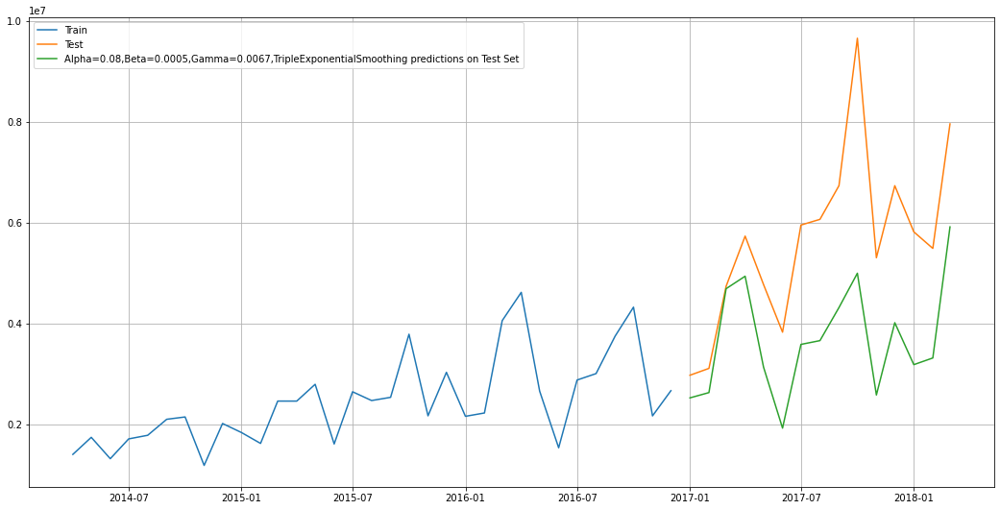

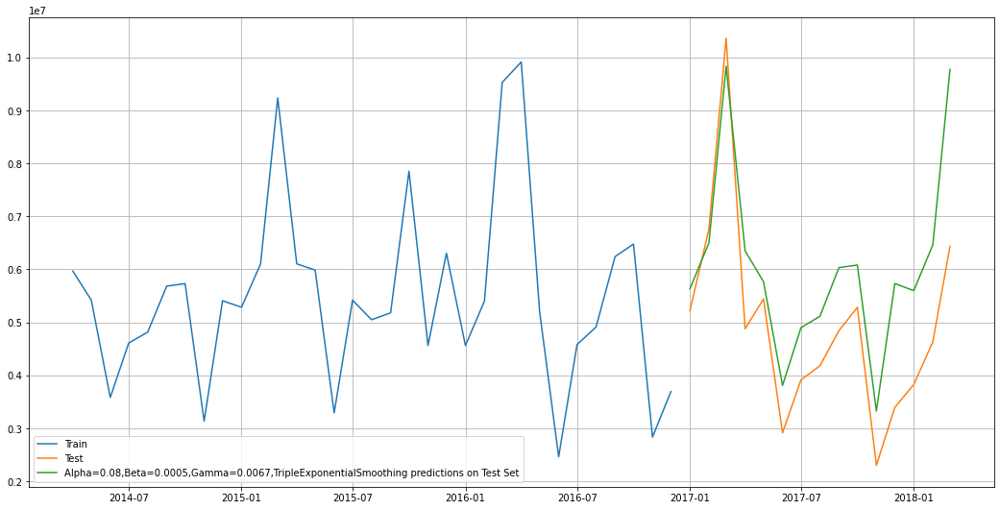

In [30]:
for city in  cp3['city'].unique():
    cpth = cp3[(cp3['city']== city)]
    train    =   cpth[0:int(len(cpth)*0.7)] 
    test     =   cpth[int(len(cpth)*0.7):]
    model_TESs = ExponentialSmoothing(train['sales'],trend='multiplicative',seasonal='multiplicative',seasonal_periods=12)
    model_TES_autofits = model_TESs.fit()
    test['auto_predict'] = model_TES_autofits.forecast(steps=len(test))
    plt.figure(figsize=(18,9))
    plt.plot(train['sales'], label='Train')
    plt.plot(test['sales'], label='Test')
    plt.plot(test['auto_predict'], label='Alpha=0.08,Beta=0.0005,Gamma=0.0067,TripleExponentialSmoothing predictions on Test Set')
    plt.legend(loc='best')
    plt.grid();
    rmse_mode_test_tr = metrics.mean_squared_error(test['sales'],test['auto_predict'],squared=False)
    resultsDf.append(rmse_mode_test_tr)

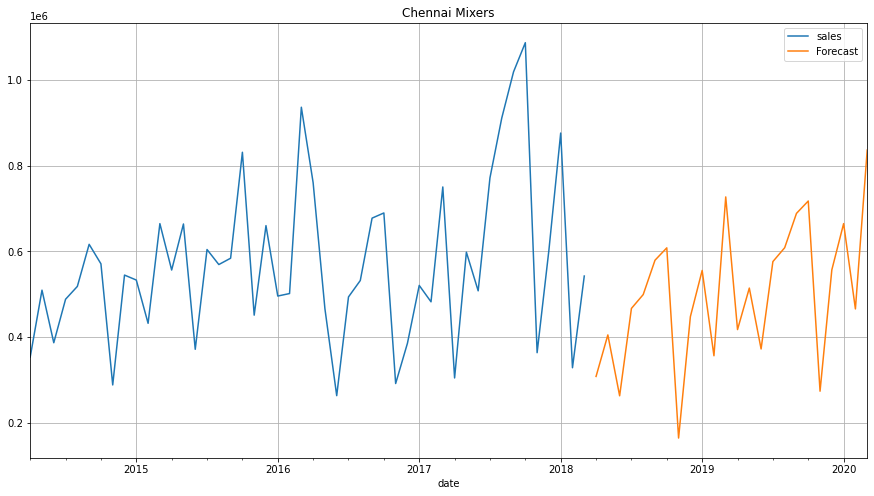

In [221]:
cpx=cp1[(cp1['city']== "Chennai") & (cp1["product"]== "Mixers")]
model_TESs = ExponentialSmoothing(cpx['sales'],trend='additive',seasonal='additive',seasonal_periods=12)
model_TES_autofits = model_TESs.fit()
prediction_TES = model_TES_autofits.forecast(steps=24)
cpx.plot(label='Actual', figsize=(15,8))
prediction_TES.plot(label='Forecast');
plt.legend(loc='best')
plt.title("Chennai Mixers")
plt.grid()
plt.show()

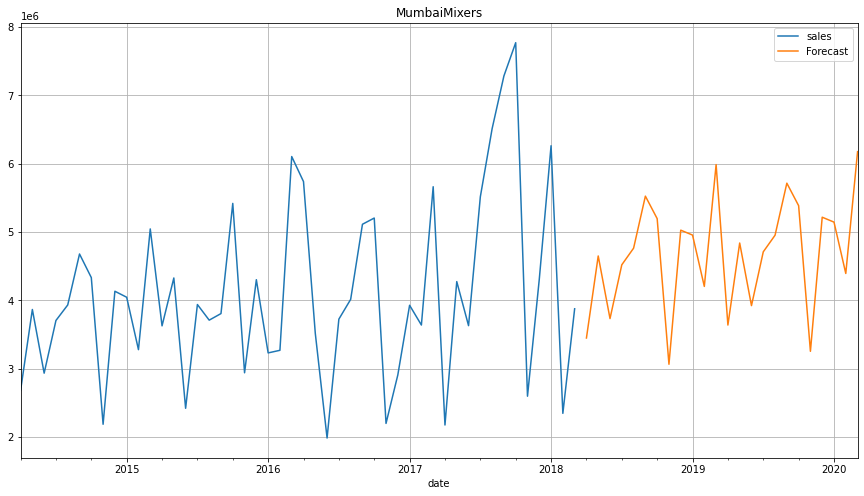

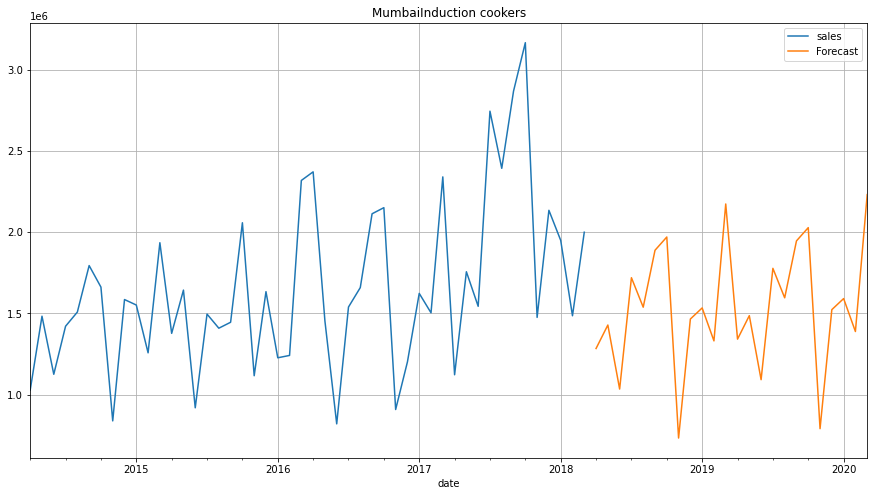

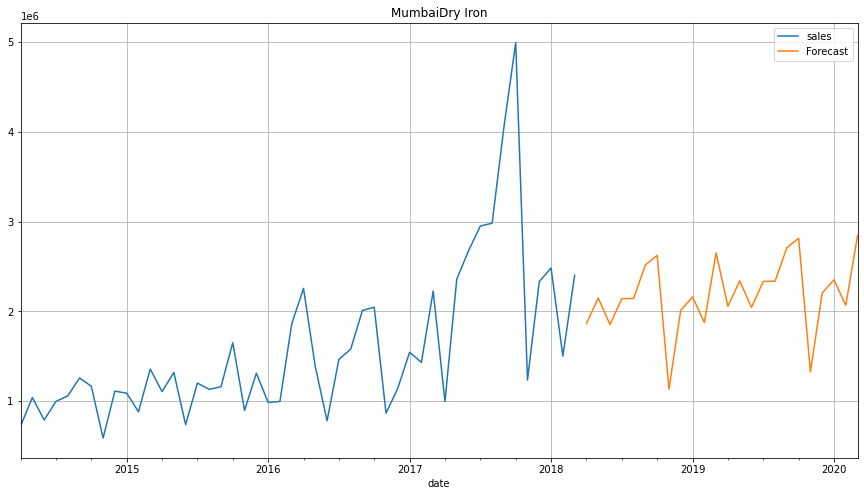

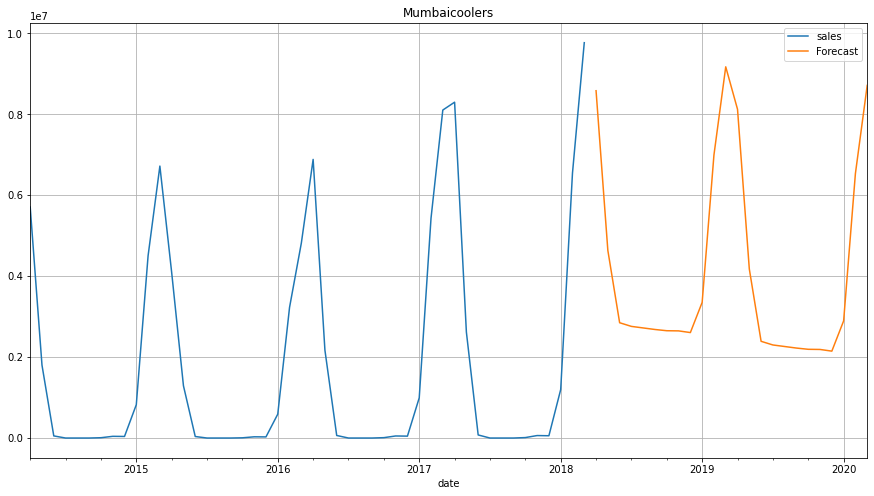

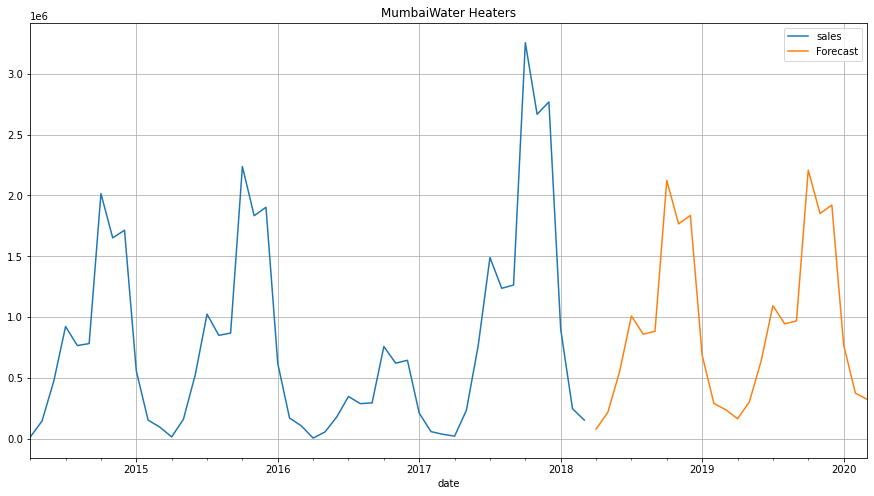

...

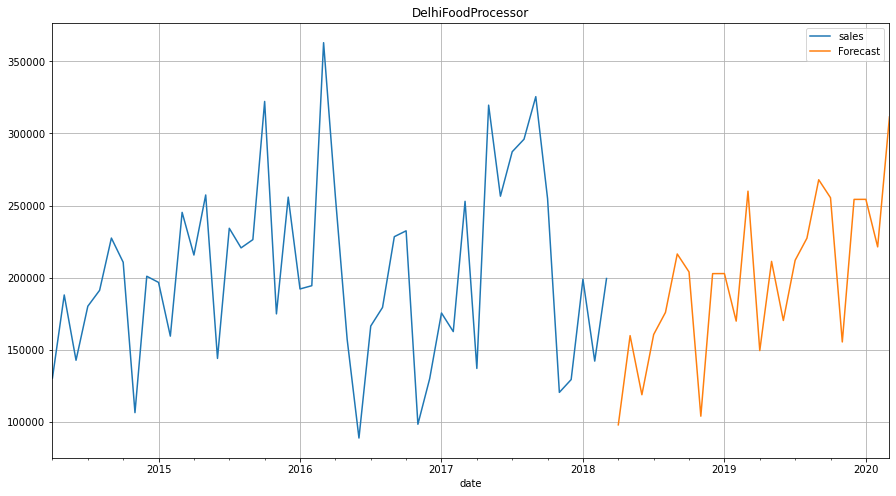

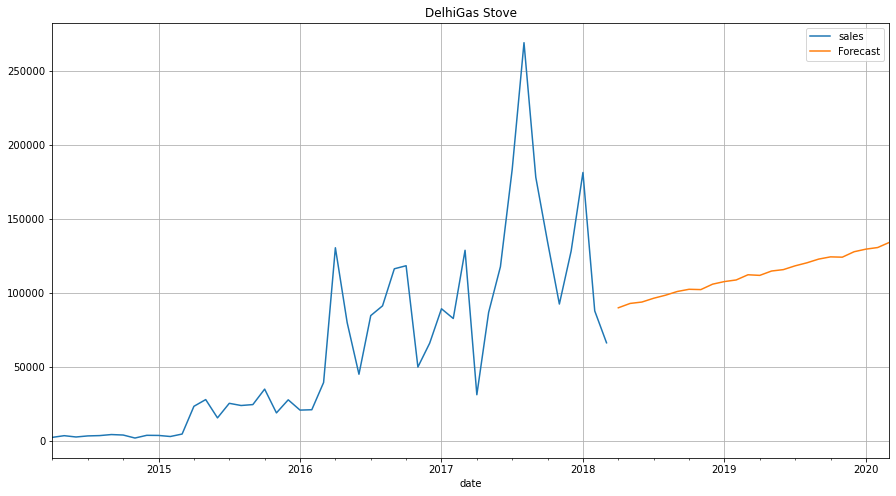

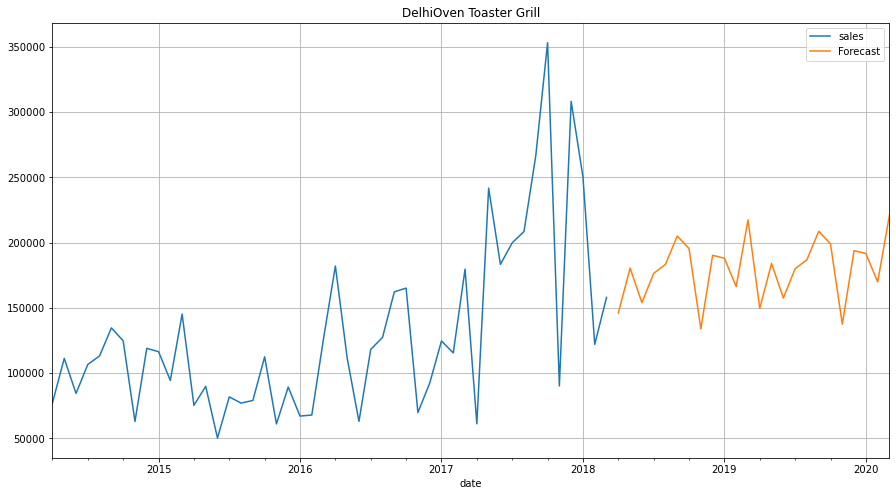

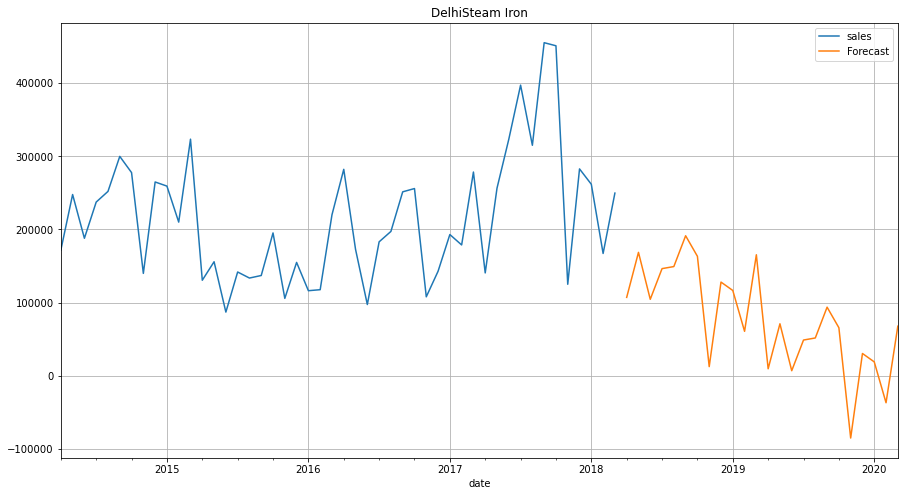

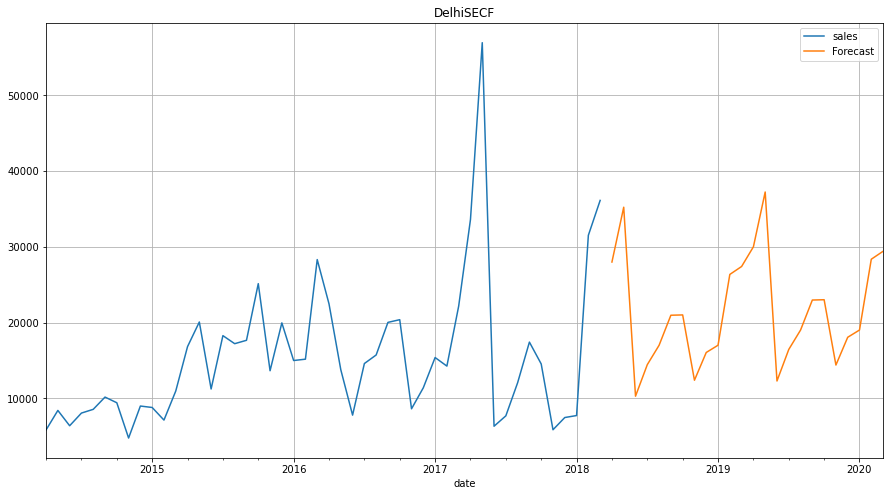

In [224]:
for city in  cp1['city'].unique():
    for prod in cp1['product'].unique():
        cp2=cp1[(cp1['city']== city) & (cp1["product"]== prod)]
        model_TESs = ExponentialSmoothing(cp2['sales'],trend='additive',seasonal='additive',seasonal_periods=12)
        model_TES_autofits = model_TESs.fit()
        prediction_TES = model_TES_autofits.forecast(steps=24)
        cp2.plot(label='Actual', figsize=(15,8))
        prediction_TES.plot(label='Forecast');
        plt.legend(loc='best')
        x=city+prod
        plt.title(x)
        plt.grid()
        plt.show()

In [19]:
from statistics import mean

In [23]:
  resultsDf

[6854461.381631121,
 1503418.170381226,
 3029413.1267291717,
 16117341.668928478,
 949723.333875415,
 8656705.09465074,
 9721844.44819593,
 7058011.988090615,
 2426274.8589129797,
 1463798.9386075698]

In [31]:
Avg= mean(resultsDf)
Avg

2002808.5793107469

In [78]:
cpc=cp3[(cp3['city']=='Ahmd')]

In [79]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [80]:
armarmse=[]

In [81]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 3)
d= range(0,1)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 0, 1)
Model: (0, 0, 2)
Model: (1, 0, 0)
Model: (1, 0, 1)
Model: (1, 0, 2)
Model: (2, 0, 0)
Model: (2, 0, 1)
Model: (2, 0, 2)


In [82]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [83]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:1064.8849492451686
ARIMA(0, 0, 1) - AIC:1058.5753798694413
ARIMA(0, 0, 2) - AIC:1060.0075346988208
ARIMA(1, 0, 0) - AIC:1057.860651515088
ARIMA(1, 0, 1) - AIC:1059.697676911608
ARIMA(1, 0, 2) - AIC:1061.3721761512347
ARIMA(2, 0, 0) - AIC:1059.6970310940962
ARIMA(2, 0, 1) - AIC:1061.8103241419583
ARIMA(2, 0, 2) - AIC:1063.3621034398566


In [84]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
3,"(1, 0, 0)",1057.860652
1,"(0, 0, 1)",1058.575380
6,"(2, 0, 0)",1059.697031
4,"(1, 0, 1)",1059.697677
2,"(0, 0, 2)",1060.007535
5,"(1, 0, 2)",1061.372176
7,"(2, 0, 1)",1061.810324
8,"(2, 0, 2)",1063.362103
0,"(0, 0, 0)",1064.884949


In [85]:
auto_ARIMAs = ARIMA(train1['sales'], order=(1,0,0))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                              ARMA Model Results                              
Dep. Variable:                  sales   No. Observations:                   33
Model:                     ARMA(1, 0)   Log Likelihood                -525.930
Method:                       css-mle   S.D. of innovations        2010829.821
Date:                Tue, 27 Jul 2021   AIC                           1057.861
Time:                        14:09:11   BIC                           1062.350
Sample:                    04-01-2014   HQIC                          1059.371
                         - 12-01-2016                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        6.094e+06   6.76e+05      9.020      0.000    4.77e+06    7.42e+06
ar.L1.sales     0.4964      0.152      3.261      0.001       0.198       0.795
                                    Roots       

In [86]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [87]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098]

# Bangalore

In [88]:
cpc=cp3[(cp3['city']=='Bangalore')]

In [89]:
cpc

,city,sales
date,,
2014-04-01,Bangalore,9791615
2014-05-01,Bangalore,8398957
2014-06-01,Bangalore,5575932
2014-07-01,Bangalore,7340545
2014-08-01,Bangalore,7555678
2014-09-01,Bangalore,8847916
2014-10-01,Bangalore,9624963
2014-11-01,Bangalore,5588651
2014-12-01,Bangalore,8979765


In [90]:
train2    =   cpc[0:int(len(cpc)*0.7)] 
test2     =   cpc[int(len(cpc)*0.7):]

In [91]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [92]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train2['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:1073.6961020070555
ARIMA(0, 0, 1) - AIC:1071.5605345962226
ARIMA(0, 0, 2) - AIC:1070.0772763106256
ARIMA(1, 0, 0) - AIC:1072.9328080453763
ARIMA(1, 0, 1) - AIC:1070.246085427267
ARIMA(1, 0, 2) - AIC:1069.9852371416735
ARIMA(2, 0, 0) - AIC:1071.894417018767
ARIMA(2, 0, 1) - AIC:1068.7099301027276
ARIMA(2, 0, 2) - AIC:1070.0012069650177


In [93]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
7,"(2, 0, 1)",1068.709930
5,"(1, 0, 2)",1069.985237
8,"(2, 0, 2)",1070.001207
2,"(0, 0, 2)",1070.077276
4,"(1, 0, 1)",1070.246085
1,"(0, 0, 1)",1071.560535
6,"(2, 0, 0)",1071.894417
3,"(1, 0, 0)",1072.932808
0,"(0, 0, 0)",1073.696102


In [94]:
auto_ARIMAs = ARIMA(train2['sales'], order=(2,0,1))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                              ARMA Model Results                              
Dep. Variable:                  sales   No. Observations:                   33
Model:                     ARMA(2, 1)   Log Likelihood                -529.355
Method:                       css-mle   S.D. of innovations        2143767.995
Date:                Tue, 27 Jul 2021   AIC                           1068.710
Time:                        14:12:01   BIC                           1076.192
Sample:                    04-01-2014   HQIC                          1071.228
                         - 12-01-2016                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        8.622e+06   1.29e+05     66.753      0.000    8.37e+06    8.88e+06
ar.L1.sales     1.0828      0.156      6.956      0.000       0.778       1.388
ar.L2.sales    -0.4656      0.158     -2.955    

In [95]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test2))

In [96]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test2['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098, 2936496.2046459103]

# Chennai

In [97]:
cpc=cp3[(cp3['city']=='Chennai')]

In [98]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]


In [99]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [100]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:1095.6063804947194
ARIMA(0, 0, 1) - AIC:1079.5694892946024
ARIMA(0, 0, 2) - AIC:1074.7211162770323
ARIMA(1, 0, 0) - AIC:1082.8703661120412
ARIMA(1, 0, 1) - AIC:1077.8926232286121
ARIMA(1, 0, 2) - AIC:1076.6297960699455
ARIMA(2, 0, 0) - AIC:1073.9498061847949
ARIMA(2, 0, 1) - AIC:1075.936563186808
ARIMA(2, 0, 2) - AIC:1075.0473948686104


In [102]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
6,"(2, 0, 0)",1073.949806
2,"(0, 0, 2)",1074.721116
8,"(2, 0, 2)",1075.047395
7,"(2, 0, 1)",1075.936563
5,"(1, 0, 2)",1076.629796
4,"(1, 0, 1)",1077.892623
1,"(0, 0, 1)",1079.569489
3,"(1, 0, 0)",1082.870366
0,"(0, 0, 0)",1095.606380


In [103]:
auto_ARIMAs = ARIMA(train1['sales'], order=(2,0,0))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                              ARMA Model Results                              
Dep. Variable:                  sales   No. Observations:                   33
Model:                     ARMA(2, 0)   Log Likelihood                -532.975
Method:                       css-mle   S.D. of innovations        2455229.106
Date:                Tue, 27 Jul 2021   AIC                           1073.950
Time:                        14:14:03   BIC                           1079.936
Sample:                    04-01-2014   HQIC                          1075.964
                         - 12-01-2016                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        5.483e+06   7.38e+05      7.431      0.000    4.04e+06    6.93e+06
ar.L1.sales     0.9605      0.151      6.375      0.000       0.665       1.256
ar.L2.sales    -0.5451      0.147     -3.707    

In [104]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [105]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098, 2936496.2046459103, 5787752.842431052]

# Cochin

In [121]:
cpc=cp3[(cp3['city']=='Cochin')]
cpc

,city,sales
date,,
2014-04-01,Cochin,5578723
2014-05-01,Cochin,3760672
2014-06-01,Cochin,2056233
2014-07-01,Cochin,2627810
2014-08-01,Cochin,2739702
2014-09-01,Cochin,3229905
2014-10-01,Cochin,3295235
2014-11-01,Cochin,1834342
2014-12-01,Cochin,3116107


In [107]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [109]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [110]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:1093.2328276040469
ARIMA(0, 0, 1) - AIC:1077.4681756310013
ARIMA(0, 0, 2) - AIC:1076.4709927441947
ARIMA(1, 0, 0) - AIC:1069.6231597074227
ARIMA(1, 0, 1) - AIC:1071.6209649313435
ARIMA(1, 0, 2) - AIC:1072.807441597599
ARIMA(2, 0, 0) - AIC:1071.6215367821308
ARIMA(2, 0, 1) - AIC:1073.4728735411343
ARIMA(2, 0, 2) - AIC:1074.6719850106776


In [111]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
3,"(1, 0, 0)",1069.623160
4,"(1, 0, 1)",1071.620965
6,"(2, 0, 0)",1071.621537
5,"(1, 0, 2)",1072.807442
7,"(2, 0, 1)",1073.472874
8,"(2, 0, 2)",1074.671985
2,"(0, 0, 2)",1076.470993
1,"(0, 0, 1)",1077.468176
0,"(0, 0, 0)",1093.232828


In [112]:
auto_ARIMAs = ARIMA(train1['sales'], order=(1,0,0))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                              ARMA Model Results                              
Dep. Variable:                  sales   No. Observations:                   33
Model:                     ARMA(1, 0)   Log Likelihood                -531.812
Method:                       css-mle   S.D. of innovations        2382584.175
Date:                Tue, 27 Jul 2021   AIC                           1069.623
Time:                        14:15:12   BIC                           1074.113
Sample:                    04-01-2014   HQIC                          1071.134
                         - 12-01-2016                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        5.639e+06   1.58e+06      3.579      0.000    2.55e+06    8.73e+06
ar.L1.sales     0.7565      0.116      6.502      0.000       0.528       0.985
                                    Roots       

In [113]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [114]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098, 2936496.2046459103, 5787752.842431052, 3069702.867616269]

# Delhi

In [122]:
cpc=cp3[(cp3['city']=='Delhi')]
cpc

,city,sales
date,,
2014-04-01,Delhi,1697065
2014-05-01,Delhi,1517153
2014-06-01,Delhi,1010471
2014-07-01,Delhi,1313979
2014-08-01,Delhi,1363408
2014-09-01,Delhi,1603361
2014-10-01,Delhi,1674859
2014-11-01,Delhi,943115
2014-12-01,Delhi,1571759


In [123]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [124]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [126]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:995.5922347463833
ARIMA(0, 0, 1) - AIC:987.8792839503412
ARIMA(0, 0, 2) - AIC:989.8338069384624
ARIMA(1, 0, 0) - AIC:990.0887474468054
ARIMA(1, 0, 1) - AIC:989.8355859359154


LinAlgError: SVD did not converge

In [127]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
1,"(0, 0, 1)",987.879284
2,"(0, 0, 2)",989.833807
4,"(1, 0, 1)",989.835586
3,"(1, 0, 0)",990.088747
0,"(0, 0, 0)",995.592235


In [128]:
auto_ARIMAs = ARIMA(train1['sales'], order=(0,0,1))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                              ARMA Model Results                              
Dep. Variable:                  sales   No. Observations:                   33
Model:                     ARMA(0, 1)   Log Likelihood                -490.940
Method:                       css-mle   S.D. of innovations         695349.292
Date:                Tue, 27 Jul 2021   AIC                            987.879
Time:                        14:17:20   BIC                            992.369
Sample:                    04-01-2014   HQIC                           989.390
                         - 12-01-2016                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        1.925e+06   1.88e+05     10.264      0.000    1.56e+06    2.29e+06
ma.L1.sales     0.5660      0.146      3.877      0.000       0.280       0.852
                                    Roots       

In [129]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [130]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098,
 2936496.2046459103,
 5787752.842431052,
 3069702.867616269,
 1853596.466990408]

# Hyderabad

In [132]:
cpc=cp3[(cp3['city']=='Hyderabad')]

In [133]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [134]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [138]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 3)
d= range(1,3)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 2, 0)
Model: (0, 2, 1)
Model: (0, 2, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 2, 0)
Model: (1, 2, 1)
Model: (1, 2, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 2, 0)
Model: (2, 2, 1)
Model: (2, 2, 2)


In [139]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 1, 0) - AIC:1037.1790997638784
ARIMA(0, 1, 1) - AIC:1034.8088066755233
ARIMA(0, 1, 2) - AIC:1030.0607661474578
ARIMA(0, 2, 0) - AIC:1031.6246470017545
ARIMA(0, 2, 1) - AIC:1011.2284546164755
ARIMA(0, 2, 2) - AIC:nan
ARIMA(1, 1, 0) - AIC:1038.4724403732878
ARIMA(1, 1, 1) - AIC:1031.787034659099
ARIMA(1, 1, 2) - AIC:1031.7929062865408
ARIMA(1, 2, 0) - AIC:1026.7543900428634


ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_params.

In [140]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
20,"(0, 2, 1)",1011.228455
12,"(0, 2, 1)",1011.228455
25,"(1, 2, 0)",1026.754390
18,"(0, 1, 2)",1030.060766
10,"(0, 1, 2)",1030.060766
19,"(0, 2, 0)",1031.624647
11,"(0, 2, 0)",1031.624647
23,"(1, 1, 1)",1031.787035
24,"(1, 1, 2)",1031.792906
9,"(0, 1, 1)",1034.808807


In [141]:
auto_ARIMAs = ARIMA(train1['sales'], order=(0,2,1))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                             ARIMA Model Results                              
Dep. Variable:               D2.sales   No. Observations:                   31
Model:                 ARIMA(0, 2, 1)   Log Likelihood                -502.614
Method:                       css-mle   S.D. of innovations        2516873.828
Date:                Tue, 27 Jul 2021   AIC                           1011.228
Time:                        14:21:04   BIC                           1015.530
Sample:                    06-01-2014   HQIC                          1012.631
                         - 12-01-2016                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const           -2.16e+04   4.82e+04     -0.448      0.654   -1.16e+05    7.29e+04
ma.L1.D2.sales    -1.0000      0.083    -12.108      0.000      -1.162      -0.838
                                    

In [142]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [143]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098,
 2936496.2046459103,
 5787752.842431052,
 3069702.867616269,
 1853596.466990408,
 10668850.995119609]

# Kolkata

In [147]:
cpc=cp3[(cp3['city']=='Kolkata')]

In [148]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [149]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [150]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 3)
d= range(0,3)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 0, 1)
Model: (0, 0, 2)
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 2, 0)
Model: (0, 2, 1)
Model: (0, 2, 2)
Model: (1, 0, 0)
Model: (1, 0, 1)
Model: (1, 0, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 2, 0)
Model: (1, 2, 1)
Model: (1, 2, 2)
Model: (2, 0, 0)
Model: (2, 0, 1)
Model: (2, 0, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 2, 0)
Model: (2, 2, 1)
Model: (2, 2, 2)


In [151]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:1062.453578810228
ARIMA(0, 0, 1) - AIC:1063.9415299164984
ARIMA(0, 0, 2) - AIC:1065.8293441610565
ARIMA(0, 1, 0) - AIC:1048.7264624112747
ARIMA(0, 1, 1) - AIC:1030.7544370930598
ARIMA(0, 1, 2) - AIC:1032.7708547833276
ARIMA(0, 2, 0) - AIC:1048.756106509957
ARIMA(0, 2, 1) - AIC:1022.965818372415
ARIMA(0, 2, 2) - AIC:1008.3122880799633
ARIMA(1, 0, 0) - AIC:1063.9967577469502
ARIMA(1, 0, 1) - AIC:1066.099086426025
ARIMA(1, 0, 2) - AIC:1067.88532534607
ARIMA(1, 1, 0) - AIC:1045.343290290634


LinAlgError: SVD did not converge

In [152]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
8,"(0, 2, 2)",1008.312288
7,"(0, 2, 1)",1022.965818
4,"(0, 1, 1)",1030.754437
5,"(0, 1, 2)",1032.770855
12,"(1, 1, 0)",1045.343290
3,"(0, 1, 0)",1048.726462
6,"(0, 2, 0)",1048.756107
0,"(0, 0, 0)",1062.453579
1,"(0, 0, 1)",1063.941530
9,"(1, 0, 0)",1063.996758


In [153]:
auto_ARIMAs = ARIMA(train1['sales'], order=(0,2,2))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                             ARIMA Model Results                              
Dep. Variable:               D2.sales   No. Observations:                   31
Model:                 ARIMA(0, 2, 2)   Log Likelihood                -500.156
Method:                       css-mle   S.D. of innovations        2109907.594
Date:                Tue, 27 Jul 2021   AIC                           1008.312
Time:                        14:41:07   BIC                           1014.048
Sample:                    06-01-2014   HQIC                          1010.182
                         - 12-01-2016                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -5359.7431   8427.766     -0.636      0.525   -2.19e+04    1.12e+04
ma.L1.D2.sales    -1.9802      0.121    -16.389      0.000      -2.217      -1.743
ma.L2.D2.sales     1.0000      0.120

In [154]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [155]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098,
 2936496.2046459103,
 5787752.842431052,
 3069702.867616269,
 1853596.466990408,
 10668850.995119609,
 12325362.132357437]

# Mumbai

In [156]:
cpc=cp3[(cp3['city']=='Mumbai')]

In [157]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [158]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [159]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:1103.843088554977
ARIMA(0, 0, 1) - AIC:1103.6572149838007
ARIMA(0, 0, 2) - AIC:1100.013499204836
ARIMA(0, 1, 0) - AIC:1085.8704944993092
ARIMA(0, 1, 1) - AIC:1076.87461951897
ARIMA(0, 1, 2) - AIC:1076.4780100019639
ARIMA(0, 2, 0) - AIC:1081.091546624281
ARIMA(0, 2, 1) - AIC:1058.4850584974793
ARIMA(0, 2, 2) - AIC:nan
ARIMA(1, 0, 0) - AIC:1104.479298804244
ARIMA(1, 0, 1) - AIC:1101.958107163066
ARIMA(1, 0, 2) - AIC:1101.6575602549258
ARIMA(1, 1, 0) - AIC:1086.0343887953782
ARIMA(1, 1, 1) - AIC:1077.161428641654
ARIMA(1, 1, 2) - AIC:1074.8524560872218
ARIMA(1, 2, 0) - AIC:1072.8658956193267
ARIMA(1, 2, 1) - AIC:1059.1307395642345


ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_params.

In [160]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
7,"(0, 2, 1)",1058.485058
16,"(1, 2, 1)",1059.130740
15,"(1, 2, 0)",1072.865896
14,"(1, 1, 2)",1074.852456
5,"(0, 1, 2)",1076.478010
4,"(0, 1, 1)",1076.874620
13,"(1, 1, 1)",1077.161429
6,"(0, 2, 0)",1081.091547
3,"(0, 1, 0)",1085.870494
12,"(1, 1, 0)",1086.034389


In [161]:
auto_ARIMAs = ARIMA(train1['sales'], order=(0,2,1))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                             ARIMA Model Results                              
Dep. Variable:               D2.sales   No. Observations:                   31
Model:                 ARIMA(0, 2, 1)   Log Likelihood                -526.243
Method:                       css-mle   S.D. of innovations        5393623.980
Date:                Tue, 27 Jul 2021   AIC                           1058.485
Time:                        14:41:55   BIC                           1062.787
Sample:                    06-01-2014   HQIC                          1059.887
                         - 12-01-2016                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -3.418e+04   1.03e+05     -0.331      0.741   -2.37e+05    1.68e+05
ma.L1.D2.sales    -1.0000      0.082    -12.159      0.000      -1.161      -0.839
                                    

In [162]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [163]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098,
 2936496.2046459103,
 5787752.842431052,
 3069702.867616269,
 1853596.466990408,
 10668850.995119609,
 12325362.132357437,
 18706588.869890448]

# Patna

In [164]:
cpc=cp3[(cp3['city']=='Patna')]

In [165]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [166]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [167]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:999.1270305812087
ARIMA(0, 0, 1) - AIC:995.5840263151131
ARIMA(0, 0, 2) - AIC:997.4831332247336
ARIMA(0, 1, 0) - AIC:974.2587379799751
ARIMA(0, 1, 1) - AIC:959.4184267996189
ARIMA(0, 1, 2) - AIC:961.0017759723681
ARIMA(0, 2, 0) - AIC:974.3838994656642
ARIMA(0, 2, 1) - AIC:950.3107369102354
ARIMA(0, 2, 2) - AIC:939.1425278727344
ARIMA(1, 0, 0) - AIC:995.138845915855
ARIMA(1, 0, 1) - AIC:996.0016668569847
ARIMA(1, 0, 2) - AIC:997.0196328939335
ARIMA(1, 1, 0) - AIC:973.3237951076618


ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_params.

In [168]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
8,"(0, 2, 2)",939.142528
7,"(0, 2, 1)",950.310737
4,"(0, 1, 1)",959.418427
5,"(0, 1, 2)",961.001776
12,"(1, 1, 0)",973.323795
3,"(0, 1, 0)",974.258738
6,"(0, 2, 0)",974.383899
9,"(1, 0, 0)",995.138846
1,"(0, 0, 1)",995.584026
10,"(1, 0, 1)",996.001667


In [169]:
auto_ARIMAs = ARIMA(train1['sales'], order=(0,2,2))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                             ARIMA Model Results                              
Dep. Variable:               D2.sales   No. Observations:                   31
Model:                 ARIMA(0, 2, 2)   Log Likelihood                -465.571
Method:                       css-mle   S.D. of innovations         688908.504
Date:                Tue, 27 Jul 2021   AIC                            939.143
Time:                        14:42:45   BIC                            944.878
Sample:                    06-01-2014   HQIC                           941.012
                         - 12-01-2016                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -2509.0235   2554.578     -0.982      0.326   -7515.904    2497.857
ma.L1.D2.sales    -1.9841      0.136    -14.573      0.000      -2.251      -1.717
ma.L2.D2.sales     1.0000      0.136

In [170]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [171]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098,
 2936496.2046459103,
 5787752.842431052,
 3069702.867616269,
 1853596.466990408,
 10668850.995119609,
 12325362.132357437,
 18706588.869890448,
 3434702.332316708]

# Pune

In [172]:
cpc=cp3[(cp3['city']=='Pune')]

In [173]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [174]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

,param,AIC


In [175]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

ARIMA(0, 0, 0) - AIC:1045.034595011888
ARIMA(0, 0, 1) - AIC:1043.888670306095
ARIMA(0, 0, 2) - AIC:1043.2819445981404
ARIMA(0, 1, 0) - AIC:1026.5734099594317
ARIMA(0, 1, 1) - AIC:1019.9704541485992
ARIMA(0, 1, 2) - AIC:1018.3340469631995
ARIMA(0, 2, 0) - AIC:1023.1288960915931
ARIMA(0, 2, 1) - AIC:nan
ARIMA(0, 2, 2) - AIC:nan
ARIMA(1, 0, 0) - AIC:1044.8592200884411
ARIMA(1, 0, 1) - AIC:1042.3966410307496
ARIMA(1, 0, 2) - AIC:1044.3529838465597
ARIMA(1, 1, 0) - AIC:1027.034135506607
ARIMA(1, 1, 1) - AIC:1019.2438831662896
ARIMA(1, 1, 2) - AIC:1017.0805785949275
ARIMA(1, 2, 0) - AIC:1015.223117494895
ARIMA(1, 2, 1) - AIC:1001.9540957924326


ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_params.

In [176]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

,param,AIC
16,"(1, 2, 1)",1001.954096
15,"(1, 2, 0)",1015.223117
14,"(1, 1, 2)",1017.080579
5,"(0, 1, 2)",1018.334047
13,"(1, 1, 1)",1019.243883
4,"(0, 1, 1)",1019.970454
6,"(0, 2, 0)",1023.128896
3,"(0, 1, 0)",1026.573410
12,"(1, 1, 0)",1027.034136
10,"(1, 0, 1)",1042.396641


In [177]:
auto_ARIMAs = ARIMA(train1['sales'], order=(1,2,1))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

                             ARIMA Model Results                              
Dep. Variable:               D2.sales   No. Observations:                   31
Model:                 ARIMA(1, 2, 1)   Log Likelihood                -496.977
Method:                       css-mle   S.D. of innovations        2100738.367
Date:                Tue, 27 Jul 2021   AIC                           1001.954
Time:                        14:43:18   BIC                           1007.690
Sample:                    06-01-2014   HQIC                          1003.824
                         - 12-01-2016                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1.783e+04   3.45e+04     -0.516      0.606   -8.55e+04    4.99e+04
ar.L1.D2.sales    -0.1929      0.175     -1.099      0.272      -0.537       0.151
ma.L1.D2.sales    -0.9843      0.087

In [178]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [179]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse

[2370354.004516098,
 2936496.2046459103,
 5787752.842431052,
 3069702.867616269,
 1853596.466990408,
 10668850.995119609,
 12325362.132357437,
 18706588.869890448,
 3434702.332316708,
 5633174.836783236]

In [182]:
Avg1=mean(armarmse)
Avg1

6678658.155266717

In [ ]:
cpc=cp3[(cp3['city']=='Ahmd')]

In [ ]:
train1    =   cpc[0:int(len(cpc)*0.7)] 
test1     =   cpc[int(len(cpc)*0.7):]

In [ ]:
# Creating an empty Dataframe with column names only
ARIMA_AICs = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AICs

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_models = ARIMA(train1['sales'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_models.aic))
    ARIMA_AICs = ARIMA_AICs.append({'param':param, 'AIC': ARIMA_models.aic}, ignore_index=True)

In [ ]:
ARIMA_AICs.sort_values(by='AIC',ascending=True)

In [ ]:
auto_ARIMAs = ARIMA(train1['sales'], order=(2,0,0))

results_auto_ARIMAs = auto_ARIMAs.fit()

print(results_auto_ARIMAs.summary())

In [ ]:
predicted_auto_ARIMAs = results_auto_ARIMAs.forecast(steps=len(test1))

In [ ]:
from sklearn.metrics import  mean_squared_error
rmses = mean_squared_error(test1['sales'],predicted_auto_ARIMAs[0],squared=False)
armarmse.append(rmses)
armarmse